# FT-ICR analysis - PART 1

Created on 01 March 2020 for the Pentatrap experiment

@author: Menno Door<br>
@contact: door+fticr@mpi-k.de<br>
@license: MIT license

### Refenences :

used toolkit of Jonas Karthein for PI-ICR as template :) thank you!!<br>

For references reguarding the theory behind ft-icr detection and analysis methods, please check the references.md file.

### Introduction

This part of the analysis does the conversion of the raw data to penning trap eigenfrequency data. You will be able to group, filter and average data and then fit spectra and/or evaluate pnp phase data to determine these frequencies.

### Important remark:

This is more a visualization thing, especially for bigger data sets i would recommend to do this using a normal python script including some multiprocessing.

Please be patient with this one! Gathering information on paths in fhds structures may take a while, loading data too. So please look at the circle on the top right corner (jupyter notebook), if its filled, there is still something going on and you should just wait.

### Requirements:

The following code was written for Python 3.7/3.8. The required libraries are listed below with a rough description for their task in the code.

    fhds (inhouse data storage, https://git.mpi-hd.mpg.de/Pentatrap/fhds)
    h5py (data storage, easier to distribute)
    pandas (data organisation, calculation and visualization)
    numpy (calculation)
    matplotlib (plotting)
    scipy (chi square fitting)
    jupyter (Python notebook environment)
    ipywidgets (https://ipywidgets.readthedocs.io/en/latest/user_install.html)
    plotly (plotting, https://github.com/plotly/plotly.py#installation)
    qgrid (data visualization, https://github.com/quantopian/qgrid#installation)

### ToDo 

- check for phase correlation here with single phases, short and long phases and unwrap.

In [1]:
# standard libs
from datetime import datetime
from pathlib import Path
import os, json
from pprint import pprint

# math and data
import numpy as np
import scipy
import pandas as pd
import h5py

# visualization
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
%matplotlib inline
import matplotlib.pyplot as plt
import qgrid
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
py.init_notebook_mode()
plt.rcParams['figure.figsize'] = (10, 4)

%load_ext autoreload
%autoreload 2

# this package
from fhds import fhds, interface
from fticr_toolkit import *
#from trap_control import fitaxialClass

### Step 1: Load raw data and inspect

The input_data filename should be either a folder following fhds rules (append ".fhds" to the folder name please) or a hdf5 file.

In [2]:
###   P A R A M E T E R   L I S T   ( this is especially used for batch processing using the papermill package )
#measurement_folder = 'Z:/DATA_for_ANALYSIS/analysis_Menno/20_Re_Os_ratio_cancellation/187Re29+_187Os29+_187Re29+_24'
#measurement_folder = "E:\\\\local_analysis\\132Xe_208Pb\\132Xe26+_208Pb41+_132Xe26+_6"
measurement_folder = "E:\\local_analysis\\Yb170174\\170Yb42+_174Yb43+_170Yb42+_13"
measurement_folder = "E:\\local_analysis\\Yb170174\\170Yb42+_174Yb43+_170Yb42+_12"
#measurement_folder = "E:\\local_analysis\\YbMeta\\174Yb43+_1"
measurement_folder = "E:\\local_analysis\\Yb168172\\172Yb43+_168Yb42+_172Yb43+_5"
#measurement_folder = "E:\\local_analysis\\Yb172174\\174Yb42+_172Yb42+_174Yb42+_var_10"
#measurement_folder = "Z:\Measurements\\174Yb41+_unity_feedback_3khz_2"
measurement_folder = "Z:\\DATA_for_ANALYSIS\\analysis_Menno\\Yb174172\\174Yb42+_172Yb42+_174Yb42+_var_10"
#measurement_folder = "Z:\\DATA_for_ANALYSIS\\analysis_Menno\\91_Characterization_ReOsCancellation\\test_of_dipole+quad_systematics"
#measurement_folder = "Z:\Measurements\\132Xe25+_208Pb38+_132Xe25+_test"
#measurement_folder = "Z:\\Measurements\\test_magphase_trap2_3"
measurement_folder = "G:\\Yb\\172174_var3_opti\\174Yb42+_172Yb42+_174Yb42+_var3_53_opti"
measurement_folder = "G:\\Yb\\172176_var\\176Yb42+_172Yb42+_176Yb42+_var_4"
measurement_folder = "G:\\Yb\\17241+42+_binding_var\\172Yb42+_172Yb41+_172Yb42+_var_9"
measurement_folder = "G:\\Yb_dualPnPtest\\172Yb43+_dual_num_nup_test_3"
measurement_folder = "G:\\Yb\\17241+42+_binding_var_dualPnP\\172Yb42+_172Yb41+_172Yb42+_dual_8"

#measurement_folder = "Z:/DATA_for_ANALYSIS/analysis_Menno/20_Re_Os_ratio_cancellation/187Re29+_187Os29+_187Re29+_24"
input_file = 'pnp_dip_unwrap.fhds'
output_folder = "./part1_data/"
use_settings_file = False
settings = {
    #"grouping": [0,-1,0,-1,0,-1,0,-1,0,-1], # use -1 to not use the axial
    #"grouping": [0,0,0,1,1,1,1,2,2,2], # use -1 to not use the axial
    "grouping": [0,0,0,0,0,0], # use -1 to not use the axial
    "reuse_averages": True,
    "reuse_fitdata": True,
    "single_axial_fits": True,
    "fixed_phase_readout": True,
    "filter_axial_by_phase": False,
    "input_file": False,
    "downsample": 5,
    "fit_func": 'pavel',
    "plot": True
}

In [3]:
if settings["input_file"]:
    input_file = settings["input_file"]

data, meas_config, output_folder = data_conversion.load_data(measurement_folder=measurement_folder, 
                          input_data=input_file, 
                          output_folder="part1_data",
                          measurement_script = "unwrap_n_measure_repeat"
                         )

#  'position_1': {   'configuration': {   'traps': {   2: {  
positions = [k for k in meas_config.keys() if k.startswith('position')]
traps = ['trap'+str(k) for k in meas_config[positions[0]]['configuration']['traps'].keys()]
print(positions)
print(traps)

if use_settings_file:
    settings = data_conversion.load_settings(measurement_folder, settings)
print("settings", settings)

#pprint(meas_config)
data_root = data["meas_data"]


 >>> WARNING!!! output_folder already exists! files will maybe be overwritten! <<< 


 >>> I hope you are in PART1, loading raw measurement data now... <<< 

['position_1', 'position_2']
['trap2', 'trap3']
settings {'grouping': [0, 0, 0, 0, 0, 0], 'reuse_averages': True, 'reuse_fitdata': True, 'single_axial_fits': True, 'fixed_phase_readout': True, 'filter_axial_by_phase': False, 'input_file': False, 'downsample': 5, 'fit_func': 'pavel', 'plot': True}


In [4]:
####
# Chech the data structure, cycles and such
#
####

mcycles = list(data_root.keys())
print("root group names / MAIN CYCLES : ", mcycles )

measurement_types = list( data_root[mcycles[0]].keys() )
print("check out first group / MEASUREMENT TYPES : ", measurement_types )
meas_name = None
for mtype in measurement_types:
    if 'unwrap' not in mtype:
        meas_name = mtype 
print(meas_name)

#pnp_subcycles = data_root[mcycles[0]][measurement_types[0]].keys()
#pnp_subcycles = data_conversion.sort_cycles(pnp_subcycles) # This is important, dont forget it!
#print("check out 2nd level of "+measurement_types[0]+" (SUBCYCLES?): ", pnp_subcycles)
pnp_subcycles = {}
for mc in mcycles:
    cycle_list = data_root[mc][meas_name].keys()
    cycle_list = data_conversion.sort_cycles(cycle_list) # This is important, dont forget it!
    pnp_subcycles[mc] = cycle_list
print("check out 2nd level of "+meas_name+" (SUBCYCLES?): ", pnp_subcycles)

def printpath(name, obj):
    print(name, obj.path)
#data_root.visititems(printpath)

root group names / MAIN CYCLES :  ['cycle1', 'cycle2', 'cycle3', 'cycle4']
check out first group / MEASUREMENT TYPES :  ['pnp_measurement', 'pre_unwrap']
pnp_measurement
check out 2nd level of pnp_measurement (SUBCYCLES?):  {'cycle1': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle2': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle3': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle4': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'c

In [5]:
## get the keys of the data we are intereseted in...

#raw_data_keys = data_conversion.get_data_paths( data_root, attr_type = ("amplitude", "phase") ) # super slow in fhds since all meta json files have to be read
raw_data_keys = data_conversion.get_data_paths( data_root, name_includes= ("nu_z", "phase") )
#pprint(raw_data_keys)

In [6]:
# Here you can check each spectrum individually, sorry for the simple drop down list of all specs, but everything else would be annoying to program here.

@interact
def spectrum_plot(key=raw_data_keys, center = widgets.FloatText(0), span = widgets.FloatText(20), downsample_factor = widgets.IntText(1)):
    try:        
        spec = data_conversion.Spectrum(data_root[key])
        dep = spec.attrs["depth"]
        tr = spec.attrs["tr"]
        if center == 0:
            pos = spec.attrs["position"]
            trap = spec.attrs["trap"][-1]
            center = meas_config[pos]["configuration"]["traps"][int(trap)]["nu_z"]
        spec.cut(center, span)
        
        ds_freqs, ds_amps = spec.downsample(downsample_factor, inplace=False)
        
        print(data_root[key][:].size)
        fig=plt.figure(figsize=(20, 8))

        ax1 = plt.subplot(211)
        plt.plot(spec.freqs, spec.amps)
        plt.plot(ds_freqs, ds_amps, linewidth=2)
        plt.title(str(spec.attrs["time"])+"    cycle "+str(spec.attrs["cycle"])+"    "+spec.attrs["position"]+"    "+str(spec.attrs["trap"])+"    avg: "+str(spec.attrs["avg_num"]))
        print(spec.attrs.keys())
        print('U0', dep, 'tr', tr, 'ce', dep*tr)
        # share x only
        ax2 = plt.subplot(212, sharex=ax1)
        ax2.set_ylim(0, 2*np.pi)
        plt.plot(spec.freqs, spec.phases)
        plt.show()
    except:
        raise
        print("not spectrum data here...")

interactive(children=(Dropdown(description='key', options=('cycle1/pnp_measurement/cycle1/position_1/trap2/tim…

In [7]:
# Check phases to filter data

grouping = settings.get("grouping", [0,0,0,0,0,0])


phase_data = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "average_idx", "amp" ] )

for mc in mcycles:
    pnp_measurement_grp = data_root[mc]["pnp_measurement"]
    for subcycle in pnp_subcycles[mc]:
        subcycle_grp = pnp_measurement_grp[subcycle]
        print('\n mc sc', mc, subcycle, end=' ')

        for pos in positions:
            position_grp = subcycle_grp[pos]
            
            for trap in traps:
                
                #print(trap)
                try:
                    trap_grp = position_grp[trap]
                except:
                    continue
                                    
                if trap_grp is None:
                    continue
                        
                #trap_grp.sort_values(by="time", inplace=True)
                only_attr = {"type": "phase"}
                nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]
            
                for name, dset in trap_grp.items():
                    
                    # check if this is the correct type of data to average
                    skip = False
                    for attr, val in only_attr.items():
                        if dset.attrs[attr] != val:
                            skip = True
                    if skip:
                        #print('why?')
                        continue

                    #print(counter, grouping[counter])
                    
                    # NOTE: this here is sadly very important: the dset[:] has to come before
                    #       getting the attributes, due to some automated update in fhds
                    dset_data = dset[:]
                    dset_attrs = {}
                    for key, val in dset.attrs.items():
                        dset_attrs[key] = val
                        
                    freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])
                    
                    idx = (np.abs(freqs - nu_z)).argmin()
                    phase = dset_data[1][idx]
                    amp = dset_data[0][idx]
                    
                    #print("subcycle", subcycle, "pos", pos, "trap", trap, "name", name, "\tnu_z", nu_z, "\tphase", phase, "\tamp", amp, end="\n")
                    print('.', end='')
                    
                    # add they data
                    dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, 0, amp ] , index=phase_data.columns)
                    phase_data = phase_data.append(dset, ignore_index=True)




 mc sc cycle1 cycle1 ........................................
 mc sc cycle1 cycle2 ........................................
 mc sc cycle1 cycle3 ........................................
 mc sc cycle1 cycle4 ........................................
 mc sc cycle1 cycle5 ........................................
 mc sc cycle1 cycle6 ........................................
 mc sc cycle1 cycle7 ........................................
 mc sc cycle1 cycle8 ........................................
 mc sc cycle1 cycle9 ........................................
 mc sc cycle1 cycle10 ........................................
 mc sc cycle1 cycle11 ........................................
 mc sc cycle1 cycle12 ........................................
 mc sc cycle1 cycle13 ........................................
 mc sc cycle1 cycle14 ........................................
 mc sc cycle1 cycle15 ........................................
 mc sc cycle1 cycle16 ........................................


In [8]:
print(" >>> PHASE DATA >>> ")
phase_data["acc_time"] = phase_data["acc_time"].astype(str)
phase_data["time"] = pd.to_datetime(phase_data['time'], format='%Y%m%d_%H%M%S.%f')
fig = px.scatter(phase_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()

ref_acc = phase_data['acc_time'].min()
ref_data = phase_data[phase_data.acc_time == ref_acc]

filter_settings = pd.DataFrame(columns=['mcycle','trap','position','min_cycle','max_cycle'])

std_threshold = 0.9
for gname, grp in ref_data.groupby(['mcycle','trap','position']):
    mc, t, po = gname
    ref_stds = []
    ref_meds = []
    stop = None
    start = 0
    for sc, scgrp in grp.groupby('cycle'):
        std = np.std(np.unwrap(scgrp.phase.to_numpy()))
        med = np.median(np.unwrap(scgrp.phase.to_numpy()))
        ref_stds.append(std)
        ref_meds.append(med)
        if (std > std_threshold and stop is None) or (np.abs(np.mean(ref_meds)-med) > std_threshold and stop is None):
            stop = sc - 1
        if stop is not None and std < std_threshold and (sc-stop) < 3:
            stop = None
    
    if stop is None:
        stop = 99
    if stop == 1:
        stop = 0
        
    #print(mc, t, po, ref_stds)

    #good_cycles = np.argwhere(np.asarray(ref_stds) < 1)
    #if len(good_cycles) == 0:
    #    start, stop = 0, 0
    #else:
    #    start = good_cycles.min() + 1
    #    stop = good_cycles.max() + 1
    
    row = pd.Series([mc, t, po, start, stop], index=filter_settings.columns)
    filter_settings = filter_settings.append(row, ignore_index=True)

#display(filter_settings)
for gname, grp in filter_settings.groupby(['mcycle','trap']):
    start = grp.min_cycle.max()
    stop = grp.max_cycle.min()
    filter_settings.at[grp.index, 'min_cycle'] = start
    filter_settings.at[grp.index, 'max_cycle'] = stop
    
display(filter_settings)
filter_settings.to_csv(measurement_folder+'\\filter_settings.csv')

 >>> PHASE DATA >>> 


,mcycle,trap,position,min_cycle,max_cycle
0,1,2,position_1,0,99
1,1,2,position_2,0,99
2,1,3,position_1,0,99
3,1,3,position_2,0,99
4,2,2,position_1,0,20
5,2,2,position_2,0,20
6,2,3,position_1,0,99
7,2,3,position_2,0,99
8,3,2,position_1,0,99
9,3,2,position_2,0,99


### Step 2: Fit axial dip, all 10 averages

The **structure** is main cycle / subcycle (typ. 25) / position (typ. 2) / trap (typ. 2) / spectra (typ. 10). **If this changes you have to modify the loop!**

In [9]:
# refresher:
print("MAIN CYCLES : ", mcycles )
print("MEASUREMENT TYPES : ", measurement_types )
print("SUBCYCLES : ", pnp_subcycles)
print("POSITIONS : ", positions)
print("TRAPS : ", traps)

MAIN CYCLES :  ['cycle1', 'cycle2', 'cycle3', 'cycle4']
MEASUREMENT TYPES :  ['pnp_measurement', 'pre_unwrap']
SUBCYCLES :  {'cycle1': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle2': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle3': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10', 'cycle11', 'cycle12', 'cycle13', 'cycle14', 'cycle15', 'cycle16', 'cycle17', 'cycle18', 'cycle19', 'cycle20', 'cycle21'], 'cycle4': ['cycle1', 'cycle2', 'cycle3', 'cycle4', 'cycle5', 'cycle6', 'cycle7', 'cycle8', 'cycle9', 'cycle10']}
POSITIONS :  ['position_1', 'position_2']
TRAPS :  ['trap2',

In [10]:
# you can filter these datasets manually, e.g.:
#mcycles = mcycles[0] # just the first main cycle
#pnp_subcycles = pnp_subcycles[:10] # only the first 10 cycles (python indexing would make it to 9, but 0 is actually cycle1, so everything is back to normal ;) )
#pnp_subcycles = pnp_subcycles[:-1] # last subcycle is incomplete

In [11]:
axial_avg_all_filename = Path(output_folder, "axial_avg_all.hdf5")
overhead = 3

grouping = settings["grouping"]
if not settings["reuse_averages"]:
    data_conversion.clear_h5py_file(axial_avg_all_filename)

    # you have to know your data structure here and loop over the correct parts of the paths to the actual datasets.
    # for every for-loop a subgroup of the fhds/hdf5 datagroup is picked out.
    print("avaraging...")
    for mc in mcycles:
        pnp_measurement_grp = data_root[mc]["pnp_measurement"]
        for subcycle in pnp_subcycles[mc]:
            subcycle_grp = pnp_measurement_grp[subcycle]
            for pos in positions:
                position_grp = subcycle_grp[pos]
                for trap in traps:
                    try:
                        # get filter settings
                        #print(filter_settings)
                        #print(mc, pos, trap)
                        #if pos == "position_1": continue
                        fs = filter_settings[(filter_settings['mcycle']==int(mc[-1])) & (filter_settings['position']==pos) & (filter_settings['trap']==int(trap[-1]))]
                        #print(fs)
                        sc = int(subcycle[5:])
                        minc = int(fs.min_cycle)
                        maxc = int(fs.max_cycle)
                        if sc < minc or sc > (maxc + overhead):# or minc == maxc:
                            print('filtered out', mc, pos, trap, subcycle)
                            continue
                        
                        trap_grp = position_grp[trap]
                        print("maincycle", mc, "subcycle", subcycle, "pos", pos, "trap", trap)

                        #averaged_data_array = data_conversion.average_data(trap_grp, average_group_lengths = grouping, only_attr = {"type": "amplitude"})
                        averaged_data_array = spec_averaging.average_data(trap_grp, average_indexes = grouping, only_attr = {"type": "amplitude"})
                        
                        for idx, data in averaged_data_array.items():
                            if idx == -1:
                                continue
                                
                            #plt.plot(data["array"][0])
                            #plt.show()
                            data_tuple = ( data["array"], data["attrs"] )
                            #print( data["array"][0].dtype, data["attrs"] )
                            path = "/m"+str(mc)+"/s"+str(subcycle)+"/"+str(pos)+"/"+str(trap)+"/avggrp"+str(idx)
                            #print(path)
                            writing_ok = data_conversion.write_save(axial_avg_all_filename, path, data_tuple[0], attrs=data_tuple[1], check=True)
                            #print(data_tuple[0])
                            #print( trap_grp.path, idx, path, writing_ok)

                    except Exception as e:
                        #raise
                        print(e)
                        print("incomplete something...")
                        
    count = 0
    def is_dset(name):
        global count
        if name.endswith("avggrp0"):
            count += 1

    with h5py.File(axial_avg_all_filename, 'r') as fobj:
        fobj.visit(is_dset)
        print("\naveraging done", count)


In [12]:
# Here you can check each spectrum individually, sorry for the simple drop down list of all specs, but everything else would be annoying to program here.
spec_root = h5py.File(axial_avg_all_filename, 'r')['mcycle1']
avg_spec_keys = data_conversion.get_data_paths( spec_root )

@interact
def spectrum_plot(key=avg_spec_keys, center = widgets.FloatText(0), span = widgets.FloatText(20), downsample_factor = widgets.IntText(1)):
    try:        
        
        spec = data_conversion.Spectrum(spec_root[key])
        if center == 0:
            pos = spec.attrs["position"]
            trap = spec.attrs["trap"][-1]
            center = meas_config[pos]["configuration"]["traps"][int(trap)]["nu_z"]
            print(center)
            
        print(min(spec.freqs), max(spec.freqs))
        spec.cut(center, span)
        
        print(spec_root[key][:].size)
        fig=plt.figure(figsize=(20, 8))

        ds_freqs, ds_amps = spec.downsample(downsample_factor, inplace=False)
    
        ax1 = plt.subplot(211)
        plt.plot(spec.freqs, spec.amps)
        plt.plot(ds_freqs, ds_amps, linewidth=4)
        plt.title(str(spec.attrs["time"])+"    cycle "+str(spec.attrs["cycle"])+"    "+spec.attrs["position"]+"    "+str(spec.attrs["trap"])+"    avg: "+str(spec.attrs["avg_num"]))
        print(spec.attrs.keys())
        # share x only
        ax2 = plt.subplot(212, sharex=ax1)
        ax2.set_ylim(0, 2*np.pi)
        plt.plot(spec.freqs, spec.phases)
        plt.show()
    except:
        print("not spectrum data here...")

interactive(children=(Dropdown(description='key', options=('scycle1/position_1/trap2/avggrp0', 'scycle1/positi…

In [13]:
## NOW FITTING THE DATA
grouping = settings["grouping"]
fit_func = settings["fit_func"]
plot = settings.get("plot", False)

axial_avg_all_filename = Path(output_folder, "axial_avg_all.hdf5")

avg_axial_fitdata = pd.DataFrame( columns=["mcycle", "cycle", "position", "trap", "acc_time", "time", 
                                           "nu_z", "dnu_z", "dip_width", "ddip_width", "fit_err", "fit_success", "average_idx", 
                                           "nu_res", "dnu_res", "Q", "dQ", "th", "dth", "off", "doff", "A", "dA" ] )

from fticr_toolkit.fit_dip import fit_dip as fit_dip_alex
from fticr_toolkit.fit_dip import dip_func as dip_func_alex
import copy
import fticr_toolkit.fitaxialClass_Pavel as fitaxialClass_Pavel

if not settings["reuse_fitdata"]:
    for mc in mcycles:
        for subcycle in pnp_subcycles[mc]:
            #if int(subcycle[5:]) > 8 or int(mc[5:]) > 1:
            #    continue
            for pos in positions:
                for trap in traps:
                    #print(trap)
                    avg_indexes = list(set(grouping))
                    #for idx, avg_len in enumerate(grouping):
                    for idx in avg_indexes:
                        path = "/m"+str(mc)+"/s"+str(subcycle)+"/"+str(pos)+"/"+str(trap)+"/avggrp"+str(idx)
                        print(path)
                        if idx==-1:
                            continue

                        try:
                            try:
                                with h5py.File(axial_avg_all_filename, 'r') as fobj:
                                    #fobj.visit(print)
                                    dset = fobj[path]
                                    data = dset[:]
                                    spec = data_conversion.Spectrum(dset)
                                    attrs = data_conversion.attrs_to_dict(dset)
                                    #for key, val in dset.attrs.items():
                                    #    #print(key, val)
                            except:
                                #raise
                                print(path, "not available, continue with other data")
                                dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), 0, '19700101_000000.000',
                                                       0, 0, 0, 0, 0, False, idx, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0 ] , index=avg_axial_fitdata.columns)
                                avg_axial_fitdata = avg_axial_fitdata.append(dset, ignore_index=True)
                                continue
                            
                            nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]
                            LO = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["LO"]

                            if len(spec.freqs) < 10000:
                                # typically at least a resolution of 0.1 Hz (seconds), so at least 1000 kHz span, otherwise, its bad data.
                                raise IndexError("The given spectrum is too small (<10000 points) to be an axial spectrum... ")
    
                            x = spec.freqs
                            y = spec.amps
    
                            # trap 2
                            config = {
                                "center" : nu_z,
                                "nu_z" : nu_z,
                                "dip_center": nu_z,
                                "res_span" : 3000,
                                "resonator_span" : 3000, # same same
                                "span" : 10,
                                "dip_span": 20,
                                "q_guess" : 4000, 
                                "dip_range" : 5, 
                                "width_range" : [0.1, 3],
                                "min_dip_width": 0.01,
                                "plot": False,
                                "print_fit_report": False,
                                "plot_results": plot,
                                "fancy_plot": True,
                                "equal_widths": False,
                                "vary_off": False,
                                "vary_slope": False,
                                "vary_A": False,
                                "vary_nu_res": False,
                                "vary_Q": False,
                                "vary_nu_z_jitter": False,
                                "nu_z_jitter": 0.0,
                                "slope": 0.0,
                                "min_dip_depth": 4.0,
                                "double_dips": False,
                            }
            
                            if trap == 'trap3':
                                config['dip_span'] = 80
                                config['q_quess'] = 11000
                                config['vary_A'] = True
                                config['vary_nu_res'] = True
                                config['vary_Q'] = True
                        
                            
                            try:
                                
                                if fit_func == 'menno':
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, beta0 = [None, 5e3, None, 1e-6, None, None, 0.1], 
                                    #                                        res_span=config['res_span'], dip_span=config['dip_span'], fixed_res='varA',
                                    #                                        rough_resonator=0, auto_better_guess=True)
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    popt, perr, data = fitaxial.mennofit(x, y, nu_z, dip_span=config['dip_span'], dip_odr=False, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, res_span=2200, dip_span=dip_span, fixed_res=False)   
                                    #data, popt, pcov = fit_dip_alex(x, y, **fit_config)
                                    #data["fit_success"] = True
                                    data["fit_err_chi**2_red"] = data['fit_err']
                                    #plt.plot(x,y,label = 'data')
                                    #plt.plot(x, dip_func_alex(x,*popt)+ data['amp_offset'], label = "dip_fit")
                                    #plt.xlim(data["nu_z"] - 20, data["nu_z"] + 20)
                                    #plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z config')
                                    #plt.legend()
                                    #plt.show()

                                elif fit_func == 'pavel':
                                    
                                    fitPavel = fitaxialClass_Pavel.AXIAl_FIT(config)
                                    data = fitPavel.fit_axial_dip(x, y, settings["downsample"])
                                    data['fit_err_chi**2_red'] = data['redchi']
                                    data['th'] = data['slope']
                                    data['dth'] = data['dslope']
                                    data['off'] = data['offset']
                                    data['doff'] = data['doffset']

                                elif fit_func == 'daniel':
                                    
                                    fit_obj = fitaxial.AXIAl_FIT()
                                    fit_obj = fitaxialClass_old.AXIAl_FIT(fit_opt)
                                    popt, perr, data = fit_obj.fit_axial_dip_test_new(x, y)
                                    #popt, perr, data = fit_obj.fit_axial_dip(x, y)

                            except:
                                raise
                                data = {"fit_success": False}

                            
                            if not data["fit_success"]:
                                raise ValueError('bad fit')
                            
                            dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), attrs["acc_time"], attrs["time"], 
                                                   data["nu_z"], data["dnu_z"], data["dip_width"], data["ddip_width"], data["fit_err_chi**2_red"],
                                                   data["fit_success"], idx, data["nu_res"], data["dnu_res"],
                                                   data["Q"], data["dQ"], data["th"], data["dth"], data["off"], data["doff"], 
                                                   data["A"], data["dA"] ], index=avg_axial_fitdata.columns)

                            avg_axial_fitdata = avg_axial_fitdata.append(dset, ignore_index=True)

                        except Exception as e:
                            #raise
                            spec.cut(nu_z, 60)
                            x, y = spec.freqs, spec.amps
                            plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z guess')
                            plt.plot(x, y)
                            plt.show()
                            #raise
                            dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), attrs["acc_time"], attrs["time"], 
                                                   0, 0, 0, 0, 0, False, idx, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0 ] , index=avg_axial_fitdata.columns)
                            avg_axial_fitdata = avg_axial_fitdata.append(dset, ignore_index=True)
                            print("\n FIT FAILED \n DATA MISSING? \nTRY raise to see what really happenig...", e, "\n")
                            
display(avg_axial_fitdata)

,mcycle,cycle,position,trap,acc_time,time,nu_z,dnu_z,dip_width,ddip_width,...,nu_res,dnu_res,Q,dQ,th,dth,off,doff,A,dA


In [14]:
if not settings["reuse_fitdata"]:
    avg_axial_fitdata["time"] = pd.to_datetime(avg_axial_fitdata['time'], format='%Y%m%d_%H%M%S.%f')
    #display(avg_axial_fitdata)
    display(avg_axial_fitdata[avg_axial_fitdata["fit_success"]==True ])

    avg_axial_fitdata.to_csv(output_folder + "/axial_data.csv", index=False)
else:
    avg_axial_fitdata = pd.read_csv(output_folder + "/axial_data.csv")

In [15]:
# single spec fit.
avg_axial_fitdata_single = pd.DataFrame( columns=["mcycle", "cycle", "position", "trap", "acc_time", "time", 
                                           "nu_z", "dnu_z", "dip_width", "ddip_width", "fit_err", "fit_success", "average_idx", 
                                           "nu_res", "dnu_res", "Q", "dQ", "th", "dth", "off", "doff", "A", "dA" ] )


# you have to know your data structure here and loop over the correct parts of the paths to the actual datasets.
# for every for-loop a subgroup of the fhds/hdf5 datagroup is picked out.
if settings.get("single_axial_fits", False) and not settings["reuse_fitdata"]: #and not settings.get("reuse_fitdata", True):
    print("SINGLE FITS...")
    for mc in mcycles:
        pnp_measurement_grp = data_root[mc]["pnp_measurement"]
        for subcycle in pnp_subcycles[mc]:
            subcycle_grp = pnp_measurement_grp[subcycle]
            for pos in positions:
                position_grp = subcycle_grp[pos]
                for trap in traps:
                    try:
                        trap_grp = position_grp[trap]
                        
                        fs = filter_settings[(filter_settings['mcycle']==int(mc[-1])) & (filter_settings['position']==pos) & (filter_settings['trap']==int(trap[-1]))]
                        #print(fs)
                        sc = int(subcycle[5:])
                        minc = int(fs.min_cycle)
                        maxc = int(fs.max_cycle)
                        if sc < minc or sc > (maxc + overhead):# or minc == maxc:
                            print('filtered out', mc, pos, trap, subcycle)
                            continue
                        
                        print("maincycle", mc, "subcycle", subcycle, "pos", pos, "trap", trap)

                        keys = []
                        for name, dset in trap_grp.items():
                            use = False
                            only_attr = {"type": "amplitude"}
                            for attr, val in only_attr.items():
                                if dset.attrs[attr] == val:
                                    use = True
                            if use:
                                keys.append(name)

                        print('specs', len(keys))
                        # loop over datasets and try to fit
                        for idx, name in enumerate(keys):
                            print(name)
                            spec = data_conversion.Spectrum(trap_grp[name])
                            attrs = data_conversion.attrs_to_dict(trap_grp[name])
                            pos = attrs["position"]
                            trap = attrs["trap"][-1]
                            acc_time = attrs["acc_time"]
                            time = attrs["time"]
                            nu_z = meas_config[pos]["configuration"]["traps"][int(trap)]["nu_z"]
                            
                            if len(spec.freqs) < 10000:
                                # typically at least a resolution of 0.1 Hz (seconds), so at least 1000 kHz span, otherwise, its bad data.
                                raise IndexError("The given spectrum is too small (<10000 points) to be an axial spectrum... ")
    
                            x = spec.freqs
                            y = spec.amps
    
                            # trap 2
                            config = {
                                "center" : nu_z,
                                "nu_z" : nu_z,
                                "dip_center": nu_z,
                                "res_span" : 3000,
                                "resonator_span" : 3000, # same same
                                "span" : 10,
                                "dip_span": 20,
                                "q_guess" : 4000, 
                                "dip_range" : 5, 
                                "width_range" : [0.1, 3],
                                "min_dip_width": 0.01,
                                "plot": False,
                                "print_fit_report": False,
                                "plot_results": False,
                                "fancy_plot": False,
                                "equal_widths": False,
                                "vary_off": False,
                                "vary_slope": False,
                                "vary_A": False,
                                "vary_nu_res": False,
                                "vary_Q": False,
                                "vary_nu_z_jitter": False,
                                "nu_z_jitter": 0.0,
                                "slope": 0.0,
                                "min_dip_depth": 4.0,
                                "double_dips": False,
                            }
            
                            if trap == '3':
                                config['dip_span'] = 80
                                config['q_quess'] = 11000
                                config['vary_A'] = True
                                config['vary_nu_res'] = True
                                config['vary_Q'] = True
                        
                            
                            try:
                                
                                if fit_func == 'menno':
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, beta0 = [None, 5e3, None, 1e-6, None, None, 0.1], 
                                    #                                        res_span=config['res_span'], dip_span=config['dip_span'], fixed_res='varA',
                                    #                                        rough_resonator=0, auto_better_guess=True)
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    popt, perr, data = fitaxial.mennofit(x, y, nu_z, dip_span=config['dip_span'], dip_odr=False, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, res_span=2200, dip_span=dip_span, fixed_res=False)   
                                    #data, popt, pcov = fit_dip_alex(x, y, **fit_config)
                                    #data["fit_success"] = True
                                    data["fit_err_chi**2_red"] = data['fit_err']
                                    #plt.plot(x,y,label = 'data')
                                    #plt.plot(x, dip_func_alex(x,*popt)+ data['amp_offset'], label = "dip_fit")
                                    #plt.xlim(data["nu_z"] - 20, data["nu_z"] + 20)
                                    #plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z config')
                                    #plt.legend()
                                    #plt.show()

                                elif fit_func == 'pavel':
                                    
                                    fitPavel = fitaxialClass_Pavel.AXIAl_FIT(config)
                                    data = fitPavel.fit_axial_dip(x, y, settings["downsample"])
                                    data['fit_err_chi**2_red'] = data['redchi']
                                    data['th'] = data['slope']
                                    data['dth'] = data['dslope']
                                    data['off'] = data['offset']
                                    data['doff'] = data['doffset']

                                elif fit_func == 'daniel':
                                    
                                    fit_obj = fitaxial.AXIAl_FIT()
                                    fit_obj = fitaxialClass_old.AXIAl_FIT(fit_opt)
                                    popt, perr, data = fit_obj.fit_axial_dip_test_new(x, y)
                                    #popt, perr, data = fit_obj.fit_axial_dip(x, y)
            
                                dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap), attrs["acc_time"], time, 
                                                       data["nu_z"], data["dnu_z"], data["dip_width"], data["ddip_width"], data["fit_err_chi**2_red"],
                                                       data["fit_success"], idx, data["nu_res"], data["dnu_res"],
                                                       data["Q"], data["dQ"], data["th"], data["dth"], data["off"], data["doff"], 
                                                       data["A"], data["dA"] ], index=avg_axial_fitdata_single.columns)
                        
                            except Exception as e:
                                #raise
                                data = {"fit_success": False}
                                dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap), attrs["acc_time"], attrs["time"], 
                                                    0, 0, 0, 0, 0, False, idx, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0 ] , index=avg_axial_fitdata_single.columns)
                            
                                #raise
                                spec.cut(nu_z, 200)
                                x, y = spec.freqs, spec.amps
                                plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z guess')
                                plt.plot(x, y)
                                plt.show()
                                #raise

                                print("\n FIT FAILED \n DATA MISSING? \nTRY raise to see what really happenig...", e, "\n")

                            avg_axial_fitdata_single = avg_axial_fitdata_single.append(dset, ignore_index=True)
                            
                    except Exception as e:
                        #raise
                        print(e)
                        print('done?', mc, subcycle, trap)

In [16]:
if not settings["reuse_fitdata"]:
    avg_axial_fitdata_single["time"] = pd.to_datetime(avg_axial_fitdata_single['time'], format='%Y%m%d_%H%M%S.%f')
    #display(avg_axial_fitdata)

    avg_axial_fitdata_single.to_csv(output_folder + "/axial_data_single.csv", index=False)
else:
    avg_axial_fitdata_single = pd.read_csv(output_folder + "/axial_data_single.csv")

display(avg_axial_fitdata_single)


,mcycle,cycle,position,trap,acc_time,time,nu_z,dnu_z,dip_width,ddip_width,...,nu_res,dnu_res,Q,dQ,th,dth,off,doff,A,dA
0,1,1,position_1,2,120.05,2022-10-08 13:40:15.936882,698306.260078733671,0.016957149456,3.849103954096,0.144032188419,...,698304.930529001402,0.586915485863,3281.294909335826,21.396201445377,0.0,0.000011913129,9.189377532161e+12,1.596957089173e+11,2.891417417290e+15,3.046429494919e+13
1,1,1,position_1,2,120.05,2022-10-08 13:43:01.300902,698306.235129367677,0.016524925846,3.837169438309,0.140397489663,...,698304.811289861333,0.583646400997,3267.801989432036,21.100182382346,0.0,0.000011842726,9.140604340112e+12,1.591522071775e+11,2.879604039646e+15,3.001703543776e+13
2,1,1,position_1,2,120.05,2022-10-08 13:45:47.135836,698306.259705348290,0.016252004375,3.740143014954,0.137979000900,...,698304.985818805872,0.578048303164,3308.457298864669,21.424607461636,0.0,0.000011810010,9.331410024001e+12,1.587305798409e+11,2.932681367859e+15,3.072182048281e+13
3,1,1,position_1,2,120.05,2022-10-08 13:48:32.617429,698306.302070546546,0.016216956398,3.761092255824,0.138343082823,...,698304.074676451855,0.580891182137,3297.121485117547,21.378145946330,0.0,0.000011854563,9.104532989348e+12,1.585186939611e+11,2.916536403395e+15,3.058751942834e+13
4,1,1,position_1,2,120.05,2022-10-08 13:51:17.848923,698306.265919405385,0.016736738338,3.892333397404,0.142382486169,...,698304.756367472582,0.587583278820,3252.969939029289,21.048484638832,0.0,0.000011884938,9.029551447585e+12,1.594308386813e+11,2.858609140980e+15,2.984209829130e+13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1381,4,10,position_2,2,120.05,2022-10-10 11:25:10.794923,706772.101740683196,0.017244172922,4.099239727787,0.145617242117,...,706767.385747658554,0.596774050997,3211.421516708489,20.592939601282,0.0,0.000011906345,9.989627904229e+12,1.793317479224e+11,3.064164207120e+15,3.153072931455e+13
1382,4,10,position_2,2,120.05,2022-10-10 11:27:59.898548,706772.134392435546,0.017075507353,3.823531825133,0.143864192586,...,706766.862927811919,0.602740524425,3178.021713767888,20.375257435187,0.0,0.000011995471,9.928116768072e+12,1.817757380386e+11,3.024424235597e+15,3.103804585288e+13
1383,4,10,position_2,2,120.05,2022-10-10 11:30:48.655566,706772.092772270669,0.017507424665,4.217709393578,0.147602956199,...,706765.684653661330,0.596492436318,3193.041012635431,20.356144054982,0.0,0.000011884472,1.008033383982e+13,1.812724420385e+11,3.067193724558e+15,3.133120453403e+13
1384,4,10,position_2,2,120.05,2022-10-10 11:33:37.334488,706772.083648841246,0.017362360550,4.110724033851,0.146775596761,...,706767.089833392645,0.599884697286,3192.202710411224,20.452407836565,0.0,0.000011951015,9.862345206229e+12,1.800254097647e+11,3.038303367644e+15,3.119963502440e+13


### Step 3: Phase readout

Each phase is read out at the position given by the axial fit done before. This also means the same grouping is applied to the phase data. This applies to the normal pnp cycle, unwrap phase readout is done in the next next cell.

In [17]:

phase_data = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "average_idx", "amp" ] )

for mc in mcycles:
    pnp_measurement_grp = data_root[mc]["pnp_measurement"]
    for subcycle in pnp_subcycles[mc]:
        subcycle_grp = pnp_measurement_grp[subcycle]
        for pos in positions:
            position_grp = subcycle_grp[pos]
            for trap in traps:
                try:
                    trap_grp = position_grp[trap]
                except:
                    continue
                if trap_grp is None:
                    continue

                if settings.get("single_axial_fits", False):
                    print("single")
                    axial_data = avg_axial_fitdata_single[ (avg_axial_fitdata_single["mcycle"] == int(mc[5:])) & (avg_axial_fitdata_single["cycle"] == int(subcycle[5:])) & (avg_axial_fitdata_single["position"] == pos) & (avg_axial_fitdata_single["trap"] == int(trap[4:])) ]
                else:
                    axial_data = avg_axial_fitdata[ (avg_axial_fitdata["mcycle"] == int(mc[5:])) & (avg_axial_fitdata["cycle"] == int(subcycle[5:])) & (avg_axial_fitdata["position"] == pos) & (avg_axial_fitdata["trap"] == int(trap[4:])) ]
                #trap_grp.sort_values(by="time", inplace=True)
                only_attr = {"type": "phase"}
            
                counter = 0
                last_nu_z = 0
                for name, dset in trap_grp.items():
                    #display(axial_data)
                    # check if this is the correct type of data to average
                    skip = False
                    for attr, val in only_attr.items():
                        if dset.attrs[attr] != val:
                            skip = True
                    if skip:
                        continue
                    
                    avg_num = int(dset.attrs["avg_num"])
                    if settings.get("single_axial_fits", False):
                        idx = avg_num
                    else:
                        idx = grouping[counter]
                    #print(counter, idx)
                    
                    try:

                        nu_z = float(axial_data[ axial_data["average_idx"] == idx ]["nu_z"])
                        nu_z_time = axial_data[ axial_data["average_idx"] == idx ]["time"]
                        #print(nu_z)
                        last_nu_z = nu_z
                    except Exception as e:
                        #raise
                        nu_z = last_nu_z
                        #print(e)
                        print("NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...")
                        #raise
                        #counter += 1
                        #continue
                        #nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]

                    #print(nu_z)
                    
                    # NOTE: this here is sadly very important: the dset[:] has to come before
                    #       getting the attributes, due to some automated update in fhds
                    dset_data = dset[:]
                    dset_attrs = {}
                    for key, val in dset.attrs.items():
                        dset_attrs[key] = val
                        
                    #print(dset_attrs)
                    freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])
                    #print(freqs)
                    if nu_z == 0 or settings["fixed_phase_readout"]:
                    #if True:
                        print("ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...")
                        # take it from the config
                        nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]
                    
                    idx = (np.abs(freqs - nu_z)).argmin()
                    #print(dset_data)
                    phase = dset_data[1][idx]
                    amp = dset_data[0][idx]
                    grp_index = grouping[counter]
                    if grp_index == -1:
                        grp_index = grp_index_before
                    grp_index_before = grp_index
                        
                    #print(idx, phase, dset_attrs["time"], nu_z_time)
                    
                    counter += 1
                    counter = counter%len(grouping)
                    
                    print("subcycle", subcycle, "pos", pos, "trap", trap, "name", name, "\tnu_z", nu_z, "\tphase", phase, "\tamp", amp, end="\n")
                    
                    # add they data
                    dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, grouping[counter], amp ] , index=phase_data.columns)
                    phase_data = phase_data.append(dset, ignore_index=True)
                                    

single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 2.251324 	amp 135.91216
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 2.4241278 	amp 133.92482
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 2.4635644 	amp 134.59839
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos positi

subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 0.028903479 	amp 126.65475
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 6.249211 	amp 129.21921
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 5.9938974 	amp 125.350235
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 0.08171267 	amp 128.31721
ZERO IN NU_Z, this means, there was data,

subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 2.8711956 	amp 131.12315
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 2.339646 	amp 134.00493
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 1.8214037 	amp 130.43475
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 1.8883432 	amp 132.2181
single
ZERO IN NU_Z, this means, there w

subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 6.0863585 	amp 134.75914
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 6.005988 	amp 133.7653
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 6.0029435 	amp 135.01128
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 6.102392 	amp 135.89873
ZERO IN NU_Z, this means, there was data, but the fit

subcycle cycle4 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.3342793 	amp 123.958954
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.2177644 	amp 125.33048
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.2305098 	amp 125.537254
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.846447 	amp 126.941956
ZERO IN NU_Z, this means, there was dat

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 6.1572785 	amp 135.78122
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 5.6485586 	amp 131.31667
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 5.681568 	amp 132.98558
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 p

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 2.133132 	amp 132.12148
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 2.539541 	amp 132.97382
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.876508 	amp 133.71887
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 2.744722 	amp 124.68113
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 2.824112 	amp 125.52247
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 2.8215635 	amp 127.29741
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos posit

subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 0.2291937 	amp 126.79308
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 0.3744389 	amp 124.40146
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 0.5884256 	amp 123.518654
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 6.0994334 	amp 123.571335
ZERO IN NU_Z, this means, there was data, but th

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 4.8982477 	amp 134.00241
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 4.5668736 	amp 135.14427
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 3.6174722 	amp 133.53894
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos pos

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 4.7327924 	amp 119.10599
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 6.0025835 	amp 130.69545
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 5.871466 	amp 135.85834
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos pos

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.5377135 	amp 125.14638
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 2.8764453 	amp 125.18875
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.8350096 	amp 122.255615
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos positio

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 2.4068656 	amp 132.69618
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 2.8070738 	amp 133.89424
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 2.3121436 	amp 135.0841
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos 

subcycle cycle11 pos position_2 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 4.3413506 	amp 124.49901
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 4.5121417 	amp 123.40742
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.9254717 	amp 134.70801
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.9973043 	amp 135.76828
ZERO IN NU_Z, this means, there w

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 0.2800424 	amp 126.518166
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 0.07643146 	amp 119.08494
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 0.6424845 	amp 124.31216
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos positi

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 2.103519 	amp 133.25175
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 2.4462502 	amp 132.92093
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 1.9851077 	amp 133.77267
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos 

subcycle cycle14 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 5.261411 	amp 125.73794
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 3.7436092 	amp 122.947395
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 5.7135844 	amp 128.0805
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 5.440021 	amp 133.03047
ZERO IN NU_Z, this means, there was

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.3287883 	amp 122.1172
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 2.44115 	amp 124.96888
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.1369793 	amp 126.57414
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 2.1050062 	amp 137.21219
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 1.7380623 	amp 135.03026
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 1.6774871 	amp 135.01508
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycl

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 2.2428088 	amp 134.68347
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 2.1920688 	amp 131.85764
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 2.0416505 	amp 131.8248
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 2.826484 	amp 122.83737
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 2.0724704 	amp 126.84038
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 1.5555211 	amp 125.078835
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos

subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 5.2244854 	amp 129.8355
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 5.571493 	amp 136.28468
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 0.07453018 	amp 126.50511
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 6.2353663 	amp 127.6591
ZERO IN NU_Z, this means, there was

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 5.9348893 	amp 132.99199
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 6.079024 	amp 134.3239
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 5.703836 	amp 133.71332
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 2.5403552 	amp 125.155716
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 1.9724243 	amp 123.89896
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 3.4227672 	amp 122.8129
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos posit

subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 4.3040643 	amp 132.21558
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 3.6952355 	amp 133.68839
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 3.943601 	amp 134.58807
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.4515288 	amp 126.8312
ZERO IN NU_Z, this means, there 

subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 2.1988025 	amp 133.44986
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 2.2412846 	amp 134.51358
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.8233612 	amp 134.95781
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.9181789 	amp 136.00826
ZERO IN NU_Z, this means, there was data, but the 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 0.21258591 	amp 118.62394
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 4.470755 	amp 123.638176
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 4.254764 	amp 126.41243
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos positi

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 6.176211 	amp 134.87027
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 5.1010113 	amp 136.35718
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 6.213152 	amp 126.240486
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 5.718875 	amp 132.87688
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 6.0079513 	amp 131.98871
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.9273233 	amp 137.04486
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 tr

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 5.3442755 	amp 126.98083
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 4.4171844 	amp 126.731575
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 4.6686134 	amp 121.68755
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos po

subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 3.7854888 	amp 132.37112
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.3989139 	amp 124.09426
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 2.1904435 	amp 122.792534
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.6931393 	amp 126.47337
ZERO IN NU_Z, this means, there was dat

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.6179603 	amp 130.2671
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 2.008254 	amp 132.7115
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 2.2359102 	amp 132.20073
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 5.84593 	amp 119.235466
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 0.16952026 	amp 122.3525
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 6.009928 	amp 122.11139
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position

subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 2.0380623 	amp 131.0631
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 1.1281068 	amp 135.49777
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 1.5760463 	amp 136.30684
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 0.80948377 	amp 131.17334
single
ZERO IN NU_Z, this means, there

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 5.6965284 	amp 133.52573
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 5.9226475 	amp 135.00989
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 5.393483 	amp 136.46881
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 tr

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.8101134 	amp 121.654396
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 0.20118041 	amp 124.73243
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 0.0016288388 	amp 119.98163
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos p

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 1.4686838 	amp 131.79938
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 0.57983494 	amp 133.81221
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 0.50168383 	amp 135.12152
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 p

subcycle cycle10 pos position_2 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 3.1089768 	amp 121.737724
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 3.1169229 	amp 128.16272
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.8403527 	amp 133.62688
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.8183637 	amp 135.50554
ZERO IN NU_Z, this means, there 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 0.20377488 	amp 123.319115
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 0.8796469 	amp 125.34443
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 6.0350795 	amp 123.7619
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos positio

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.3813605 	amp 133.16975
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 5.057732 	amp 136.15715
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 5.3251657 	amp 135.04976
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos pos

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.7262356 	amp 127.0882
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 2.5507345 	amp 125.374466
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 2.3470883 	amp 126.51501
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycl

subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.7458456 	amp 126.1747
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 2.4183958 	amp 130.32822
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.253315 	amp 125.95758
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 2.4086268 	amp 126.54242
ZERO IN NU_Z, this means, there was data, but th

subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.9703574 	amp 134.72255
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 2.0148516 	amp 131.69402
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 1.7049685 	amp 129.80576
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 3.8291717 	amp 135.21059
ZERO IN NU_Z, this means, there was data, b

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 5.0553203 	amp 127.68432
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 4.252977 	amp 125.12841
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 4.0237007 	amp 128.40697
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 5.3307686 	amp 136.9968
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 0.17833813 	amp 124.35458
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 0.7166391 	amp 126.91826
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 po

subcycle cycle17 pos position_2 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 5.6366534 	amp 133.9163
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.188635 	amp 136.21095
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 2.3479464 	amp 135.78528
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 3.561561 	amp 133.21689
ZERO IN NU_Z, this means, there was data, b

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.193334 	amp 127.3855
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 3.2292376 	amp 124.899666
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 3.7356212 	amp 125.48408
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos pos

subcycle cycle19 pos position_1 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 1.4976932 	amp 134.67903
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 1.9414301 	amp 134.06902
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 1.428123 	amp 132.72865
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 0.97121906 	amp 133.48471
ZERO IN NU_Z, this means, there was d

subcycle cycle19 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 0.77058125 	amp 128.65886
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 0.18563287 	amp 122.05514
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 6.1035542 	amp 126.21026
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.2791736 	amp 136.71857
ZERO IN NU_Z, this means, th

subcycle cycle20 pos position_2 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 0.80136365 	amp 135.43698
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 6.279151 	amp 115.55943
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 5.9180036 	amp 125.201645
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 5.6525497 	amp 125.26118
ZERO IN NU_Z, this means, there was

subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 5.811846 	amp 132.93628
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 5.578829 	amp 135.36752
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 5.549712 	amp 132.61432
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 2.0656981 	amp 126.693214
ZERO IN NU_Z, this means, there was data, but th

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 2.2388237 	amp 122.05661
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.2905605 	amp 126.23297
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.679833 	amp 125.57746
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 3.6722956 	amp 133.04082
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 3.1310682 	amp 132.1617
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 3.431934 	amp 134.46407
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos posit

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 6.1119666 	amp 127.63986
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 6.0492597 	amp 123.70729
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 5.574325 	amp 124.52504
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 p

subcycle cycle3 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 5.8984666 	amp 124.320366
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 6.076842 	amp 128.5089
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 5.877533 	amp 120.84017
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 5.9829845 	amp 125.25661
ZERO IN NU_Z, this means, there was data, but the fi

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.5093684 	amp 131.0819
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 2.8064158 	amp 135.74373
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 2.4676704 	amp 127.51549
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos positio

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 4.8155055 	amp 126.98734
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 4.0496054 	amp 124.18184
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 3.9374497 	amp 125.02859
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos pos

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 3.9533918 	amp 136.2494
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 1.8117042 	amp 125.09091
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 2.2644725 	amp 126.430664
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos po

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.722085 	amp 136.3533
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.6019815 	amp 135.28616
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.8204104 	amp 128.5974
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap

subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 6.2163115 	amp 127.455
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 6.051804 	amp 122.84027
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 0.17611398 	amp 123.61219
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 0.18350178 	amp 119.87614
ZERO IN NU_Z, this means, there was data, but

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 6.1191783 	amp 133.96794
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 0.8319513 	amp 133.56766
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 0.57494444 	amp 135.70192
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos po

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 1.6865107 	amp 120.13985
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 1.1108662 	amp 120.4815
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 0.37763944 	amp 127.82268
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 

subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 3.7608707 	amp 123.19401
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 4.238976 	amp 124.004036
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 4.0170455 	amp 123.54898
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 5.80371 	amp 135.64987
ZERO IN NU_Z, this means, there 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 5.77808 	amp 134.07776
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.2433634 	amp 124.2276
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 2.2642183 	amp 124.99364
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos p

subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.800771 	amp 134.52612
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.3512814 	amp 135.59178
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.7399542 	amp 131.95508
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.6753297 	amp 134.80554
ZERO IN NU_Z, this means, there was data, but t

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 0.11904395 	amp 122.182274
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 6.0838847 	amp 125.601746
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 0.04583189 	amp 127.06126
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos posi

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.4878416 	amp 132.59764
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 0.8542517 	amp 136.02937
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 1.124398 	amp 133.02136
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos pos

subcycle cycle14 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 0.09368019 	amp 124.39883
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 0.961516 	amp 121.30417
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 0.51950216 	amp 128.6712
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 5.063374 	amp 131.75235
ZERO IN NU_Z, this means, there

subcycle cycle15 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 3.590091 	amp 132.1534
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.2908616 	amp 126.113884
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 3.499424 	amp 109.57603
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.1107912 	amp 124.48915
ZERO IN NU_Z, this means, there was da

subcycle cycle16 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.3955946 	amp 135.76524
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.709429 	amp 132.2923
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.5626972 	amp 135.84995
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 1.6365347 	amp 133.84663
ZERO IN NU_Z, this means, there was data, but th

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 5.807605 	amp 120.87246
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 5.6041574 	amp 127.77446
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 5.995704 	amp 122.185814
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_

subcycle cycle17 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.6929083 	amp 131.14128
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 0.9125276 	amp 134.61012
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 1.5841272 	amp 134.41933
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 0.8869432 	amp 135.49104
ZERO IN NU_Z, this means, there was d

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 1.2572103 	amp 119.80516
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 1.5398982 	amp 123.79392
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 0.8513646 	amp 127.51936
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 0.24489023 	amp 132.77512
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 6.023211 	amp 132.39893
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 5.8085794 	amp 129.24161
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycl

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 5.0395036 	amp 122.5258
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.87133 	amp 136.49457
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.6592685 	amp 137.38673
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos p

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 5.832885 	amp 125.29967
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 5.851619 	amp 123.697464
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 6.0455346 	amp 111.69024
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_

subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 5.19938 	amp 134.12367
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 4.9590006 	amp 133.73827
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 5.485316 	amp 134.19588
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.107956 	amp 132.32648
ZERO IN NU_Z, this means, there was data, but the 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 2.3022666 	amp 127.93159
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 1.9530368 	amp 121.12035
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 2.6095855 	amp 124.678276
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.2108034 	amp 132.32195
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 1.1952384 	amp 130.43092
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 1.0841864 	amp 135.57516
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_

subcycle cycle2 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 2.1010873 	amp 124.553474
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 5.884808 	amp 119.02299
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 4.4914546 	amp 117.56395
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 2.7786384 	amp 108.97132
ZERO IN NU_Z, this means, there was data,

subcycle cycle3 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 0.4055691 	amp 134.6951
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 5.4718013 	amp 134.913
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.875907 	amp 133.52122
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 0.18698718 	amp 131.42276
ZERO IN NU_Z, this means, there was data,

NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 4.0037165 	amp 124.12351
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 3.9502063 	amp 119.71474
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 7

single
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.3159003 	amp 127.6341
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap3 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 2.1503477 	amp 125.64022
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 1.6224788 	amp 135.5026
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 1.7383225 	amp 135.51077
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap2 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 1.301498 	amp 132.59189
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 tra

NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.2409632 	amp 121.32649
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 0.5680474 	amp 110.74181
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

subcycle cycle7 pos position_2 trap trap2 name time_0.4_phase_avg_4_atsi_0.spec 	nu_z 706771.95 	phase 5.231096 	amp 135.73166
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 0.6340873 	amp 136.20839
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 0.84439665 	amp 132.45555
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.547798 	amp 133.69904
ZERO IN NU_Z, this means, there was data, 

NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.8746855 	amp 126.78032
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.8335874 	amp 124.92914
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_120.05_phase_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 0.6024667 	amp 131.2234
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 0.6300271 	amp 134.94682
single
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 2.0910904 	amp 128.45412
NU_Z DATA MISSING, if there is no axial data, i will not create

NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_120.05_phase_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 3.8922691 	amp 122.997604
single
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_0.4_phase_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 1.7963758 	amp 127.64761
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_0.4_phase_avg_1_atsi_0.spec 	nu_z 6

In [18]:
phase_data["time"] = pd.to_datetime(phase_data['time'], format='%Y%m%d_%H%M%S.%f')
display(phase_data)
phase_data.to_csv(output_folder + "/phase_data.csv", index=False)

,mcycle,cycle,position,trap,acc_time,time,phase,average_idx,amp
0,1,1,position_1,2,0.40,2022-10-08 13:37:52.851900,2.251323938370,0,135.912155151367
1,1,1,position_1,2,0.40,2022-10-08 13:40:38.116412,2.424127817154,0,133.924819946289
2,1,1,position_1,2,0.40,2022-10-08 13:43:23.962804,2.463564395905,0,134.598388671875
3,1,1,position_1,2,0.40,2022-10-08 13:46:09.051099,1.710023283958,0,133.872680664062
4,1,1,position_1,2,0.40,2022-10-08 13:48:54.530222,2.133437156677,0,136.020980834961
...,...,...,...,...,...,...,...,...,...
2901,4,10,position_2,3,120.05,2022-10-10 11:25:11.208996,4.395127773285,0,117.051330566406
2902,4,10,position_2,3,120.05,2022-10-10 11:28:00.267198,0.912814795971,0,114.006225585938
2903,4,10,position_2,3,120.05,2022-10-10 11:30:49.017665,6.029652595520,0,110.749519348145
2904,4,10,position_2,3,120.05,2022-10-10 11:33:37.692004,0.800004482269,0,107.754920959473


In [19]:

phase2_data = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "average_idx", "amp" ] )

for mc in mcycles:
    pnp_measurement_grp = data_root[mc]["pnp_measurement"]
    for subcycle in pnp_subcycles[mc]:
        subcycle_grp = pnp_measurement_grp[subcycle]
        for pos in positions:
            position_grp = subcycle_grp[pos]
            for trap in traps:
                try:
                    trap_grp = position_grp[trap]
                except:
                    continue
                if trap_grp is None:
                    continue

                if settings.get("single_axial_fits", False):
                    axial_data = avg_axial_fitdata_single[ (avg_axial_fitdata_single["mcycle"] == int(mc[5:])) & (avg_axial_fitdata_single["cycle"] == int(subcycle[5:])) & (avg_axial_fitdata_single["position"] == pos) & (avg_axial_fitdata_single["trap"] == int(trap[4:])) ]
                else:
                    axial_data = avg_axial_fitdata[ (avg_axial_fitdata["mcycle"] == int(mc[5:])) & (avg_axial_fitdata["cycle"] == int(subcycle[5:])) & (avg_axial_fitdata["position"] == pos) & (avg_axial_fitdata["trap"] == int(trap[4:])) ]
               
                #display(axial_data)
    
                #trap_grp.sort_values(by="time", inplace=True)
                only_attr = {"type": "phase2"}
            
                counter = 0
                last_nu_z = 0
                for name, dset in trap_grp.items():
                    
                    # check if this is the correct type of data to average
                    skip = False
                    for attr, val in only_attr.items():
                        if dset.attrs[attr] != val:
                            skip = True
                    if skip:
                        continue

                    avg_num = dset.attrs["avg_num"]
                    if settings.get("single_axial_fits", False):
                        counter = avg_num
                    print(counter, grouping[counter], avg_num)

                    try:
                        nu_z = float(axial_data[ axial_data["average_idx"] == grouping[counter] ]["nu_z"])
                        nu_z_time = axial_data[ axial_data["average_idx"] == grouping[counter] ]["time"]
                        last_nu_z = nu_z
                    except Exception as e:
                        nu_z = last_nu_z
                        #print(e)
                        print("NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...")
                        #raise
                        #counter += 1
                        #continue
                        #nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]

                    #print(nu_z)
                    
                    # NOTE: this here is sadly very important: the dset[:] has to come before
                    #       getting the attributes, due to some automated update in fhds
                    dset_data = dset[:]
                    dset_attrs = {}
                    for key, val in dset.attrs.items():
                        dset_attrs[key] = val
                        
                    #print(dset_attrs)
                    freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])
                    #print(freqs)
                    if nu_z == 0 or settings["fixed_phase_readout"]:
                    #if True:
                        print("ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...")
                        # take it from the config
                        nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]
                    
                    idx = (np.abs(freqs - nu_z)).argmin()
                    #print(dset_data)
                    phase = dset_data[1][idx]
                    amp = dset_data[0][idx]
                    grp_index = grouping[counter]
                    if grp_index == -1:
                        grp_index = grp_index_before
                    grp_index_before = grp_index
                        
                    #print(idx, phase, dset_attrs["time"], nu_z_time)
                    
                    counter += 1
                    counter = counter%len(grouping)
                    
                    print("subcycle", subcycle, "pos", pos, "trap", trap, "name", name, "\tnu_z", nu_z, "\tphase", phase, "\tamp", amp, end="\n")
                    
                    # add they data
                    dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, grouping[counter], amp ] , index=phase_data.columns)
                    phase2_data = phase2_data.append(dset, ignore_index=True)
                                    

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.0312076 	amp 136.46155
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.029381 	amp 135.35352
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.123007 	amp 135.51915
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycl

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.627095 	amp 125.07708
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.1554525 	amp 123.319016
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.7565985 	amp 125.809685
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.88447 	amp 136.56778
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 5.72559 	amp 141.66908
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 0.32756215 	amp 133.24515
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...

2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 1.5192152 	amp 125.21865
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 2.6639814 	amp 128.37738
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 3.293268 	amp 130.37453
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 1.3301234 	amp 127.69969
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 5.002083 	amp 125.84135
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 1.4720727 	amp 126.904076
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 1.945962 	amp 135.81364
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 1.0529014 	amp 133.91626
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 0.28831667 	amp 137.50247
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 0.3962176 	amp 127.30675
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 1.114947 	amp 129.56119
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 0.020979198 	amp 117.42312
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that valu

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 5.8173323 	amp 133.62524
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 4.9205728 	amp 137.22688
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.949895 	amp 139.24529
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 1.5803305 	amp 131.96815
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 0.25482866 	amp 129.03964
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.0046213 	amp 125.71335
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that valu

subcycle cycle8 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.6597834 	amp 126.3908
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.840217 	amp 124.16334
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.635882 	amp 119.62835
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 4.759511 	amp 126.69695
4 0 4
ZERO IN NU_Z, this means, 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.3646483 	amp 138.00534
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 4.974316 	amp 137.72836
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 4.9302735 	amp 135.2833
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycl

subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 2.777233 	amp 125.00768
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.3332493 	amp 125.99882
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.2179663 	amp 126.91541
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.862198 	amp 126.977104
4 0 4
ZERO IN NU_Z, this mean

subcycle cycle10 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 3.9069374 	amp 133.82483
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.772135 	amp 138.65889
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 4.108138 	amp 136.02501
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 3.5992277 	amp 134.94551
4 0 4
ZERO IN NU_Z, this m

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 3.8622918 	amp 122.920364
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.987888 	amp 124.80738
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 5.099274 	amp 124.61307
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle 

subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.9703293 	amp 135.19861
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 4.9494357 	amp 137.67668
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.1974926 	amp 134.5929
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 4.958018 	amp 134.91084
4 0 4
ZERO IN NU_Z, this m

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 3.2720895 	amp 127.3524
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.9199698 	amp 124.43717
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.768867 	amp 122.46564
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.9612167 	amp 135.9605
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 3.472378 	amp 134.40074
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 3.8214169 	amp 136.64282
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.7416134 	amp 124.12803
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 5.0120163 	amp 117.54918
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.4503164 	amp 126.71757
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.688372 	amp 133.34311
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 4.965166 	amp 137.77048
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.094811 	amp 136.07947
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cy

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.695696 	amp 126.47715
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.4455569 	amp 120.55291
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 3.0974584 	amp 124.33131
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 4.0284405 	amp 136.82027
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.6885498 	amp 133.97995
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 4.0094132 	amp 136.844
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.9221425 	amp 126.98314
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.8693085 	amp 125.54592
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.4356117 	amp 125.81517
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.0945873 	amp 135.81975
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 4.961094 	amp 133.14987
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.2433352 	amp 136.19458
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle 

4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 0.9153465 	amp 137.57385
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 2.8567605 	amp 130.01486
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.6205425 	amp 126.52076
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.904703 	amp 133.75124
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 1.0739495 	amp 138.61745
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 0.46302798 	amp 137.87236
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...

2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.9356728 	amp 124.66283
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 1.4456302 	amp 122.18008
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 1.9072338 	amp 127.13647
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that va

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 1.2868052 	amp 137.04337
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 0.16881463 	amp 137.57237
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 0.9006501 	amp 140.68423
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that v

subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.987625 	amp 131.94936
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.120436 	amp 136.22649
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.3204684 	amp 134.3345
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 4.8958673 	amp 133.53767
4 0 4
ZERO IN NU_Z, this means,

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 3.4040592 	amp 124.459755
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.9656374 	amp 122.604
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.8628693 	amp 128.246
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle

subcycle cycle2 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 3.698626 	amp 137.01208
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.618706 	amp 134.73183
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 4.0225277 	amp 134.03627
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 4.123806 	amp 137.78658
4 0 4
ZERO IN NU_Z, this means,

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.815761 	amp 127.606255
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 3.9020686 	amp 122.732254
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 5.0404067 	amp 121.40964
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 4.385081 	amp 112.68256
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 698306.34 	phase 1.1777169 	amp 138.10027
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 698306.34 	phase 1.0721073 	amp 131.84018
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 1.9222292 	amp 140.69122
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 0.86468786 	amp 134.63464
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 1.7339712 	amp 142.0874
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 1.4432943 	amp 125.910194
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 2.2366247 	amp 129.2484
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 2.1413622 	amp 130.88736
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
su

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 4.7365813 	amp 126.23509
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.3802733 	amp 139.04053
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 5.4040737 	amp 134.67677
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
su

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 6.0316267 	amp 138.6186
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 5.8473353 	amp 141.12175
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.695402 	amp 141.09724
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value..

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 4.5843916 	amp 120.98639
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.3093162 	amp 123.32096
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 3.1794748 	amp 125.45871
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value

3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 4.229831 	amp 123.04379
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 5.267426 	amp 118.34873
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 3.9914339 	amp 123.2496
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcy

subcycle cycle10 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 4.9906654 	amp 135.22672
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 5.1698995 	amp 135.95436
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 698306.34 	phase 4.7260485 	amp 134.8341
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 5.900638 	amp 137.14352
1 0 1
ZERO IN NU_Z, thi

subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.173383 	amp 137.12784
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.2501574 	amp 135.09358
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 4.657982 	amp 135.99988
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 5.0231924 	amp 135.28954
4 0 4
ZERO IN NU_Z, this m

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.7266593 	amp 119.636345
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.2625902 	amp 120.19143
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.9638066 	amp 126.046906
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...


0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 3.5418713 	amp 136.17264
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.7395673 	amp 135.8437
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 3.5442705 	amp 134.81297
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 5.0490537 	amp 128.03004
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.8513236 	amp 122.74416
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.519444 	amp 126.72307
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.1249566 	amp 137.66463
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.073293 	amp 138.30228
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.1602592 	amp 135.08728
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle 

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 2.6829307 	amp 122.74479
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 3.3626895 	amp 122.76208
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.1876535 	amp 123.615364
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycl

subcycle cycle15 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 5.312336 	amp 135.69113
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 4.977095 	amp 131.59657
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 2.591548 	amp 127.25035
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 3.4537532 	amp 127.66375
2 0 2
ZERO IN NU_Z, t

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 5.4791026 	amp 137.91888
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 5.7863884 	amp 136.79585
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 5.073742 	amp 134.3873
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that valu

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.1209447 	amp 122.00247
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.7297945 	amp 123.691734
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.2759428 	amp 126.060616
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that 

3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 4.81608 	amp 123.92411
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 4.3729043 	amp 125.849045
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 3.4558108 	amp 124.4042
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
s

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.9422455 	amp 124.452736
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 5.1974573 	amp 120.00811
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 5.033963 	amp 127.26668
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle

subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.2552304 	amp 134.85919
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.2527995 	amp 137.22226
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.331773 	amp 130.55664
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 698306.34 	phase 5.114957 	amp 136.81374
4 0 4
ZERO IN NU_Z, this m

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 3.237069 	amp 128.3274
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.6995618 	amp 130.37456
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.1298003 	amp 125.92108
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 3.9718688 	amp 136.1735
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.429933 	amp 136.27979
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 3.8038814 	amp 137.13858
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.6492753 	amp 126.32998
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 3.9708831 	amp 127.013855
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.754633 	amp 126.80977
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cy

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 5.2717924 	amp 132.98575
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.1558294 	amp 135.11076
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 4.9512815 	amp 136.21306
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcy

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 0.74813336 	amp 128.0774
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 6.261664 	amp 129.46353
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 471486.09 	phase 0.97768545 	amp 118.62627
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
su

4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 3.0959609 	amp 126.75989
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 5.9207435 	amp 128.58836
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 4.759786 	amp 127.41801
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...


ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.462952 	amp 130.14423
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 2.8502395 	amp 125.076385
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 2.5534177 	amp 123.60372
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cy

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.945059 	amp 121.662704
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.2197535 	amp 116.30887
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 3.0692477 	amp 123.362885
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 3.2833512 	amp 123.3024
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.6814995 	amp 127.909294
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 2.8998206 	amp 124.88049
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cy

subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 4.4055862 	amp 139.3934
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 3.8453698 	amp 129.56355
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 4.2852306 	amp 135.43361
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 4.396371 	amp 131.71223
0 0 0
ZERO IN NU_Z

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 4.079393 	amp 140.05806
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 3.821841 	amp 139.19177
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.6232853 	amp 141.4364
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...

1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.8658302 	amp 125.1608
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.5983822 	amp 129.23732
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 2.7269182 	amp 126.5632
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value..

subcycle cycle10 pos position_1 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 4.7783265 	amp 125.37875
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.2244842 	amp 123.64276
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 6.136705 	amp 127.40478
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 1.0315151 	amp 129.26953
3 0 3
ZERO IN NU

subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.3399887 	amp 124.66912
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 477201.89 	phase 4.7782555 	amp 121.071045
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 4.7709155 	amp 122.359146
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle11 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 0.75814015 	amp 128.28873
1 0 1
ZERO IN NU_Z

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.5755973 	amp 124.368576
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.512926 	amp 125.3448
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle12 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.661735 	amp 121.52102
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.977173 	amp 136.62094
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.0507517 	amp 135.69997
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 5.304475 	amp 133.85309
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 3.3325748 	amp 124.18525
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 3.2178998 	amp 126.955345
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle13 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.772046 	amp 126.71738
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
su

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 706771.95 	phase 3.564289 	amp 135.39488
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.7445917 	amp 136.01544
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle14 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 3.5189476 	amp 134.86502
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 3.2038898 	amp 126.41462
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 477201.89 	phase 3.1480982 	amp 127.000084
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle15 pos position_1 trap trap3 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 477201.89 	phase 3.376844 	amp 128.53632
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that va

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.2352328 	amp 124.50509
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 1.736986 	amp 124.44276
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle16 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 2.7873993 	amp 129.79181
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that val

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 5.077746 	amp 143.38458
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 6.150276 	amp 136.93375
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 5.5633297 	amp 130.0678
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 6.078309 	amp 126.95169
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 1.2647926 	amp 123.8
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle17 pos position_2 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 471486.09 	phase 0.07016337 	amp 130.97775
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 4.962659 	amp 141.07762
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 2.8977678 	amp 136.73007
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle18 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.287092 	amp 137.20569
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that valu

4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 477201.89 	phase 4.549997 	amp 126.00884
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 2.808419 	amp 130.2641
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle19 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 1.9195158 	amp 126.1809
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...


ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 4.690858 	amp 128.5011
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.7178826 	amp 127.76081
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle20 pos position_1 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 477201.89 	phase 4.7140374 	amp 124.77291
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle c

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.9780717 	amp 135.98958
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 5.199241 	amp 137.53116
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_1 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 698306.34 	phase 4.8508153 	amp 135.66483
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
sub

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 471486.09 	phase 2.5754266 	amp 124.496666
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 471486.09 	phase 2.9994202 	amp 124.197174
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle21 pos position_2 trap trap3 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 471486.09 	phase 3.0114908 	amp 126.74219
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcyc

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.128962 	amp 130.69614
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 4.220282 	amp 137.59187
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle1 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 3.6791704 	amp 137.69644
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 706771.95 	phase 5.110116 	amp 137.66441
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 706771.95 	phase 4.2544255 	amp 135.67365
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle2 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.717009 	amp 139.20937
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subc

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 4.06919 	amp 124.5452
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 2.717936 	amp 129.34352
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle3 pos position_1 trap trap3 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 477201.89 	phase 4.2838845 	amp 125.52396
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...


0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 3.7513936 	amp 131.60892
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 4.6971197 	amp 135.12314
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 5.249549 	amp 137.01065
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

0 0 0
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 3.512348 	amp 124.99631
1 0 1
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle4 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 3.1011167 	amp 119.0375
2 0 2
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out th

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 706771.95 	phase 3.7824678 	amp 137.32294
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap2 name time_0.4_phase2_avg_2_atsi_0.spec 	nu_z 706771.95 	phase 3.6637616 	amp 137.7114
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle5 pos position_2 trap trap2 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 706771.95 	phase 4.1235356 	amp 137.32422
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cyc

NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap3 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 477201.89 	phase 5.0204234 	amp 121.69437
1 0 1
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_1 trap trap3 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 477201.89 	phase 4.7044353 	amp 129.45734
2 0 2
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase wi

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle6 pos position_2 trap trap3 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 471486.09 	phase 4.6046195 	amp 117.746475
0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap2 name time_0.4_phase2_avg_0_atsi_0.spec 	nu_z 698306.34 	phase 4.8087006 	amp 134.38957
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_1 trap trap2 name time_0.4_phase2_avg_1_atsi_0.spec 	nu_z 698306.34 	phase 4.947918 	amp 135.75194
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle

2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 706771.95 	phase 4.008794 	amp 137.65193
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_3_atsi_1.spec 	nu_z 706771.95 	phase 3.8178368 	amp 132.87805
4 0 4
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle7 pos position_2 trap trap2 name time_120.05_phase2_avg_4_atsi_1.spec 	nu_z 706771.95 	phase 3.420974 	amp 142.5045
0 0 0
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, 

0 0 0
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 477201.89 	phase 4.3669515 	amp 119.151375
1 0 1
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle8 pos position_1 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 477201.89 	phase 4.360616 	amp 109.20263
2 0 2
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out 

0 0 0
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 698306.34 	phase 5.800711 	amp 135.72113
1 0 1
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 698306.34 	phase 5.5242133 	amp 136.88074
2 0 2
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_1 trap trap2 name time_120.05_phase2_avg_2_atsi_1.spec 	nu_z 698306.34 	phase 4.3575397 	amp 136.44485
3 0 3
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value.

ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_3_atsi_0.spec 	nu_z 471486.09 	phase 4.0386114 	amp 119.105125
4 0 4
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_0.4_phase2_avg_4_atsi_0.spec 	nu_z 471486.09 	phase 4.4774814 	amp 112.59993
0 0 0
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle9 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	

0 0 0
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap3 name time_120.05_phase2_avg_0_atsi_1.spec 	nu_z 471486.09 	phase 0.8587947 	amp 81.89183
1 0 1
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out the phase with that value...
subcycle cycle10 pos position_2 trap trap3 name time_120.05_phase2_avg_1_atsi_1.spec 	nu_z 471486.09 	phase 5.735833 	amp 114.764404
2 0 2
NU_Z DATA MISSING, if there is no axial data, i will not create phase data to it, so just skip this...
ZERO IN NU_Z, this means, there was data, but the fit did not work, i will take the nu_z from the config an read out

In [20]:
phase2_data["time"] = pd.to_datetime(phase2_data['time'], format='%Y%m%d_%H%M%S.%f')
display(phase2_data)
phase2_data.to_csv(output_folder + "/phase2_data.csv", index=False)

,mcycle,cycle,position,trap,acc_time,time,phase,average_idx,amp
0,1,1,position_1,2,0.40,2022-10-08 13:37:52.902937,5.031207561493,0,136.461547851562
1,1,1,position_1,2,0.40,2022-10-08 13:40:38.169646,5.029380798340,0,135.353515625000
2,1,1,position_1,2,0.40,2022-10-08 13:43:24.007242,5.123006820679,0,135.519149780273
3,1,1,position_1,2,0.40,2022-10-08 13:46:09.100291,4.880461692810,0,136.495880126953
4,1,1,position_1,2,0.40,2022-10-08 13:48:54.579413,5.076361179352,0,135.817993164062
...,...,...,...,...,...,...,...,...,...
2901,4,10,position_2,3,120.05,2022-10-10 11:25:11.587625,0.858794689178,0,81.891830444336
2902,4,10,position_2,3,120.05,2022-10-10 11:28:00.624812,5.735833168030,0,114.764404296875
2903,4,10,position_2,3,120.05,2022-10-10 11:30:49.381238,4.242624282837,0,120.430412292480
2904,4,10,position_2,3,120.05,2022-10-10 11:33:38.059600,5.166466236115,0,115.625915527344


### now unwrap data...

In [21]:

pre_unwrap_phase = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "amp" ] )
#positions=["position_1", "position_2"]
#traps=[1, 2]
for mc in mcycles:
    pnp_measurement_grp = data_root[mc]["pre_unwrap"]
    for subcycle in ["cycle1"]:
        subcycle_grp = pnp_measurement_grp[subcycle]
        for pos in positions:
            print(pos)
            
            try:
                #if pos == "position_2": continue
                position_grp = subcycle_grp[pos]
                for trap in traps:
                    trap_grp = position_grp[trap]
                    print("\nsubcycle", subcycle, "pos", pos, "trap", trap)#, end="\r")
                    if trap_grp is None:
                        continue
                    #trap_grp.sort_values(by="time", inplace=True)
                    only_attr = {"type": "phase"}
                    for name, dset in trap_grp.items():
                        # check if this is the correct type of data to average
                        skip = False
                        for attr, val in only_attr.items():
                            if dset.attrs[attr] != val:
                                skip = True
                        if skip:
                            continue

                        # NOTE: this here is sadly very important: the dset[:] hhas to come before
                        #       getting the attributes, due to some automated update in fhds
                        dset_data = dset[:]
                        dset_attrs = {}
                        for key, val in dset.attrs.items():
                            dset_attrs[key] = val

                        freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])

                        nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]

                        idx = (np.abs(freqs - nu_z)).argmin()
                        phase = dset_data[1][idx]
                        amp = dset_data[0][idx]

                        # add they data
                        dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, amp ] , index=pre_unwrap_phase.columns)
                        pre_unwrap_phase = pre_unwrap_phase.append(dset, ignore_index=True)

                        print('.', end='')
            except Exception as e:
                print("something is missing", pos, e)

position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

subcycle cycle1 pos position_2 trap trap2
..................................................
subcycle cycle1 pos position_2 trap trap3
..................................................position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

subcycle cycle1 pos position_2 trap trap2
..................................................
subcycle cycle1 pos position_2 trap trap3
..................................................position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

sub

In [22]:
pre_unwrap_phase["time"] = pd.to_datetime(pre_unwrap_phase['time'], format='%Y%m%d_%H%M%S.%f')
display(pre_unwrap_phase)
pre_unwrap_phase.to_csv(output_folder + "/pre_unwrap_phase.csv", index=False)

,mcycle,cycle,position,trap,acc_time,time,phase,amp
0,1,1,position_1,2,0.4,2022-10-08 12:35:49.648943,2.223568677902,131.998107910156
1,1,1,position_1,2,0.4,2022-10-08 12:43:28.680222,2.476829767227,134.067565917969
2,1,1,position_1,2,0.4,2022-10-08 12:51:07.353205,3.077215909958,131.158020019531
3,1,1,position_1,2,0.4,2022-10-08 12:58:45.929254,2.449860811234,133.124145507812
4,1,1,position_1,2,0.4,2022-10-08 13:06:24.728186,2.122505903244,131.703613281250
...,...,...,...,...,...,...,...,...
795,4,1,position_2,3,8.0,2022-10-10 04:39:49.031068,3.742571592331,112.071731567383
796,4,1,position_2,3,8.0,2022-10-10 04:47:44.641848,0.053745646030,114.844123840332
797,4,1,position_2,3,8.0,2022-10-10 04:55:38.850713,0.970856487751,105.659919738770
798,4,1,position_2,3,8.0,2022-10-10 05:03:32.840988,4.649868965149,118.280204772949


In [23]:

pre_unwrap_phase2 = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "amp" ] )
#positions=["position_1", "position_2"]
#traps=[1, 2]
for mc in mcycles:
    pnp_measurement_grp = data_root[mc]["pre_unwrap"]
    for subcycle in ["cycle1"]:
        subcycle_grp = pnp_measurement_grp[subcycle]
        for pos in positions:
            print(pos)
            
            try:
                #if pos == "position_2": continue
                position_grp = subcycle_grp[pos]
                for trap in traps:
                    trap_grp = position_grp[trap]
                    print("\nsubcycle", subcycle, "pos", pos, "trap", trap)#, end="\r")
                    if trap_grp is None:
                        continue
                    #trap_grp.sort_values(by="time", inplace=True)
                    only_attr = {"type": "phase2"}
                    for name, dset in trap_grp.items():
                        # check if this is the correct type of data to average
                        skip = False
                        for attr, val in only_attr.items():
                            if dset.attrs[attr] != val:
                                skip = True
                        if skip:
                            continue

                        # NOTE: this here is sadly very important: the dset[:] hhas to come before
                        #       getting the attributes, due to some automated update in fhds
                        dset_data = dset[:]
                        dset_attrs = {}
                        for key, val in dset.attrs.items():
                            dset_attrs[key] = val

                        freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])

                        nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]

                        idx = (np.abs(freqs - nu_z)).argmin()
                        phase = dset_data[1][idx]
                        amp = dset_data[0][idx]

                        # add they data
                        dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, amp ] , index=pre_unwrap_phase.columns)
                        pre_unwrap_phase2 = pre_unwrap_phase2.append(dset, ignore_index=True)

                        print('.', end='')
            except Exception as e:
                print("something is missing", pos, e)

position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

subcycle cycle1 pos position_2 trap trap2
..................................................
subcycle cycle1 pos position_2 trap trap3
..................................................position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

subcycle cycle1 pos position_2 trap trap2
..................................................
subcycle cycle1 pos position_2 trap trap3
..................................................position_1

subcycle cycle1 pos position_1 trap trap2
..................................................
subcycle cycle1 pos position_1 trap trap3
..................................................position_2

sub

In [24]:
pre_unwrap_phase2["time"] = pd.to_datetime(pre_unwrap_phase2['time'], format='%Y%m%d_%H%M%S.%f')
display(pre_unwrap_phase2)
pre_unwrap_phase2.to_csv(output_folder + "/pre_unwrap_phase2.csv", index=False)

,mcycle,cycle,position,trap,acc_time,time,phase,amp
0,1,1,position_1,2,0.4,2022-10-08 12:35:49.698075,4.846659660339,137.361343383789
1,1,1,position_1,2,0.4,2022-10-08 12:43:28.741389,5.159307956696,136.218658447266
2,1,1,position_1,2,0.4,2022-10-08 12:51:07.403370,5.156054973602,132.917404174805
3,1,1,position_1,2,0.4,2022-10-08 12:58:45.976517,4.760306835175,135.296722412109
4,1,1,position_1,2,0.4,2022-10-08 13:06:24.775416,5.516901016235,134.917297363281
...,...,...,...,...,...,...,...,...
795,4,1,position_2,3,8.0,2022-10-10 04:39:49.094240,1.343028664589,123.553611755371
796,4,1,position_2,3,8.0,2022-10-10 04:47:44.714924,5.399696826935,112.532943725586
797,4,1,position_2,3,8.0,2022-10-10 04:55:38.914471,4.148261070251,126.440444946289
798,4,1,position_2,3,8.0,2022-10-10 05:03:32.893540,1.311887741089,119.443862915039


In [25]:

num_unwrap_phase = pd.DataFrame( columns=[ "mcycle", "cycle", "position", "trap", "acc_time", "time", "phase", "amp" ] )
#positions=["position_1", "position_2"]
#traps=[1, 2]
for mc in mcycles:
    try:
        pnp_measurement_grp = data_root[mc]["num_unwrap"]
        for subcycle in ["cycle1"]:
            subcycle_grp = pnp_measurement_grp[subcycle]
            for pos in positions:
                print(pos)
                #if pos == "position_2": continue
                position_grp = subcycle_grp[pos]
                for trap in traps:
                    trap_grp = position_grp[trap]
                    print("\nsubcycle", subcycle, "pos", pos, "trap", trap)#, end="\r")
                    if trap_grp is None:
                        continue
                    #trap_grp.sort_values(by="time", inplace=True)
                    only_attr = {"type": "phase"}
                    for name, dset in trap_grp.items():
                        # check if this is the correct type of data to average
                        skip = False
                        for attr, val in only_attr.items():
                            if dset.attrs[attr] != val:
                                skip = True
                        if skip:
                            continue

                        # NOTE: this here is sadly very important: the dset[:] hhas to come before
                        #       getting the attributes, due to some automated update in fhds
                        dset_data = dset[:]
                        dset_attrs = {}
                        for key, val in dset.attrs.items():
                            dset_attrs[key] = val

                        freqs = np.linspace(dset_attrs["start"], dset_attrs["stop"], dset_attrs["binnum"])

                        nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]

                        idx = (np.abs(freqs - nu_z)).argmin()
                        phase = dset_data[1][idx]
                        amp = dset_data[0][idx]

                        # add they data
                        dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), dset_attrs["acc_time"], dset_attrs["time"], phase, amp ] , index=num_unwrap_phase.columns)
                        num_unwrap_phase = num_unwrap_phase.append(dset, ignore_index=True)

                        print('.', end='')
    except:
        pass

In [26]:
try:
    num_unwrap_phase["time"] = pd.to_datetime(num_unwrap_phase['time'], format='%Y%m%d_%H%M%S.%f')
    display(num_unwrap_phase)
    num_unwrap_phase.to_csv(output_folder + "/num_unwrap_phase.csv", index=False)
except:
    pass

,mcycle,cycle,position,trap,acc_time,time,phase,amp


## Check data

 >>> AXIAL DATA >>> 


 >>> AXIAL UNCERTAINTY >>> 


 >>> AXIAL DIP WIDTH >>> 


 >>> Resonator nu_res >>> 


 >>> off_resonance nu_z - nu_res >>> 


 >>> Resonator A >>> 


 >>> Resonator Q >>> 


 >>> Resonator offset >>> 


 >>> Resonator threshold amplifier >>> 


(2, 'position_1') dipwidth mHz 3872 cooling time constant ms 41
(2, 'position_2') dipwidth mHz 4052 cooling time constant ms 39
(3, 'position_1') dipwidth mHz 22544 cooling time constant ms 7
(3, 'position_2') dipwidth mHz 24048 cooling time constant ms 6
 >>> AXIAL DATA SINGLE >>> 


c:\program files\python37\lib\site-packages\ipykernel_launcher.py:76: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



 >>> INVERTED PHASE DATA >>> 
['0.4' '120.05']




 SOMETHING WENT WRONG HERE 
 ufunc 'true_divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe'' 


 >>> PHASE DATA >>> 
['0.4' '120.05']


(2, 'position_1')
1 mean/std amp 133.25177726745605 2.053531491146401 error of mean (133.25177726745605, 0.3246918379452262)
2 mean/std amp 133.3936237335205 2.2933652292569997 error of mean (133.3936237335205, 0.3626128815543172)
3 mean/std amp 133.08294639587402 2.402076745519596 error of mean (133.08294639587402, 0.37980168151832916)
4 mean/std amp 133.51935443878173 1.9653635672287506 error of mean (133.51935443878173, 0.31075126513781565)
5 mean/std amp 133.4221332550049 1.8462267867708368 error of mean (133.4221332550049, 0.29191408617049336)
6 mean/std amp 133.04179401397704 2.2963664558998174 error of mean (133.04179401397704, 0.36308741715260145)
7 mean/std amp 134.0330280303955 2.038907426972067 error of mean (134.0330280303955, 0.32237957037325793)
8 mean/std amp 133.7110315322876 2.216416418235253 error of mean (133.7110315322876, 0.35044620625078776)
9 mean/std amp 134.25592918395995 1.9245789890714167 error of mean (134.25592918395995, 0.3043026571184992)
10 mean/std amp 

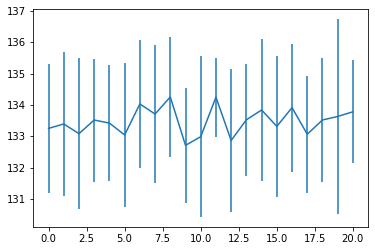

(2, 'position_2')
1 mean/std amp 133.8280117034912 1.4991103723332087 error of mean (133.8280117034912, 0.23703016202780036)
2 mean/std amp 133.7779098510742 2.1424693118013516 error of mean (133.7779098510742, 0.3387541421152868)
3 mean/std amp 134.10955734252929 1.910859735161936 error of mean (134.10955734252929, 0.3021334526108928)
4 mean/std amp 133.7282371520996 1.9961806676261813 error of mean (133.7282371520996, 0.3156238765447137)
5 mean/std amp 132.61624870300292 3.9251578059436367 error of mean (132.61624870300292, 0.6206219421185547)
6 mean/std amp 134.17151260375977 1.7507211694297176 error of mean (134.17151260375977, 0.2768133221635728)
7 mean/std amp 133.43478107452393 2.0567720704375265 error of mean (133.43478107452393, 0.3252042185201427)
8 mean/std amp 133.29233436584474 2.687839082716772 error of mean (133.29233436584474, 0.4249846742701358)
9 mean/std amp 133.56693916320802 1.5655686884269324 error of mean (133.56693916320802, 0.2475381444435799)
10 mean/std amp 1

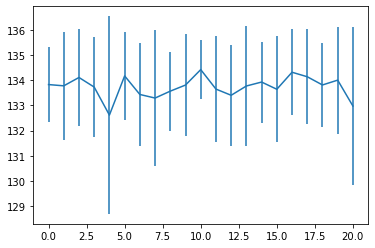

(3, 'position_1')
1 mean/std amp 124.41131610870362 2.267173969076581 error of mean (124.41131610870362, 0.3584716797063074)
2 mean/std amp 124.6796974182129 2.539867845518936 error of mean (124.6796974182129, 0.4015883673832262)
3 mean/std amp 125.75377712249755 1.9565316715471581 error of mean (125.75377712249755, 0.30935481981727375)
4 mean/std amp 124.94503345489503 2.3157299220414727 error of mean (124.94503345489503, 0.36614904997276054)
5 mean/std amp 124.70295925140381 2.720228988522088 error of mean (124.70295925140381, 0.43010596804729123)
6 mean/std amp 124.10369529724122 2.9115999243438804 error of mean (124.10369529724122, 0.4603643698050298)
7 mean/std amp 124.96365375518799 2.717261175206561 error of mean (124.96365375518799, 0.4296367155599292)
8 mean/std amp 124.95013160705567 1.961628033944104 error of mean (124.95013160705567, 0.31016062546507295)
9 mean/std amp 124.00011157989502 3.1844537447244177 error of mean (124.00011157989502, 0.5035063468390782)
10 mean/std a

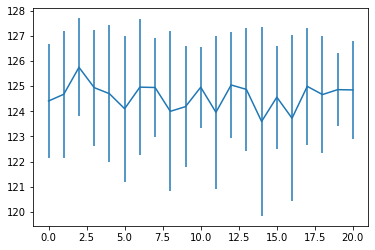

(3, 'position_2')
1 mean/std amp 122.74105186462403 5.194525771829152 error of mean (122.74105186462403, 0.8213266401712118)
2 mean/std amp 123.33841609954834 4.514666137472201 error of mean (123.33841609954834, 0.7138313934823504)
3 mean/std amp 123.05304336547852 5.9798401121436875 error of mean (123.05304336547852, 0.9454957399005378)
4 mean/std amp 122.73711681365967 4.999231264661929 error of mean (122.73711681365967, 0.7904478673127866)
5 mean/std amp 122.91918315887452 3.803563617331819 error of mean (122.91918315887452, 0.6013962128058821)
6 mean/std amp 122.09506340026856 5.040914530017802 error of mean (122.09506340026856, 0.7970385702546741)
7 mean/std amp 121.4799898147583 6.055451685220066 error of mean (121.4799898147583, 0.957450979320019)
8 mean/std amp 122.45244636535645 5.588913284495905 error of mean (122.45244636535645, 0.8836847812089842)
9 mean/std amp 122.48062763214111 5.041688673586415 error of mean (122.48062763214111, 0.7971609731003134)
10 mean/std amp 123.3

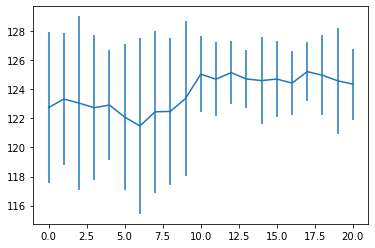

 >>> PHASE2 DATA >>> 
['0.4' '120.05']


(2, 'position_1')
1 mean/std amp 135.68274040222167 3.093282660905029 error of mean (135.68274040222167, 0.4890909327583086)
2 mean/std amp 135.48515644073487 4.51224232488998 error of mean (135.48515644073487, 0.7134481550632907)
3 mean/std amp 135.58065814971923 3.887315733770272 error of mean (135.58065814971923, 0.6146385851461391)
4 mean/std amp 135.1867971420288 4.179899375356458 error of mean (135.1867971420288, 0.6609001208220745)
5 mean/std amp 136.12027587890626 2.227179107880785 error of mean (136.12027587890626, 0.3521479369022574)
6 mean/std amp 135.7483575820923 2.452015038814047 error of mean (135.7483575820923, 0.38769761898192806)
7 mean/std amp 136.06617374420165 2.9114588663852223 error of mean (136.06617374420165, 0.46034206658345717)
8 mean/std amp 135.80684928894044 2.421440795804406 error of mean (135.80684928894044, 0.38286340669963076)
9 mean/std amp 136.32179641723633 2.3332249406981513 error of mean (136.32179641723633, 0.36891525530587277)
10 mean/std amp 13

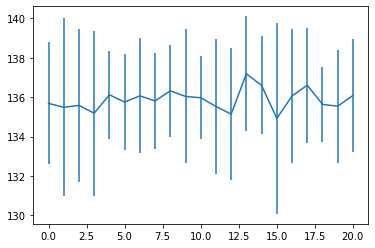

(2, 'position_2')
1 mean/std amp 136.28254203796388 2.00442362566301 error of mean (136.28254203796388, 0.31692720264739216)
2 mean/std amp 136.57751083374023 2.481970574097338 error of mean (136.57751083374023, 0.392434004983165)
3 mean/std amp 136.87735404968262 2.4312015586732802 error of mean (136.87735404968262, 0.38440671881795285)
4 mean/std amp 135.7341651916504 2.0811755852431704 error of mean (135.7341651916504, 0.32906275300511645)
5 mean/std amp 135.1503761291504 5.114843099528968 error of mean (135.1503761291504, 0.8087277034453423)
6 mean/std amp 136.07244262695312 3.0224021011373927 error of mean (136.07244262695312, 0.47788373222363734)
7 mean/std amp 136.4646759033203 2.905400826577819 error of mean (136.4646759033203, 0.45938420638608907)
8 mean/std amp 136.43050689697264 2.9726500429772074 error of mean (136.43050689697264, 0.47001724112026977)
9 mean/std amp 136.57801933288573 2.308993668639121 error of mean (136.57801933288573, 0.36508395479038613)
10 mean/std amp 

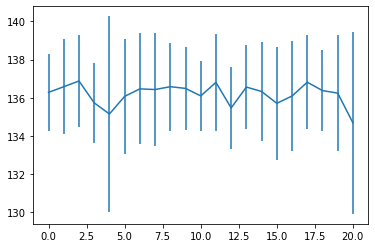

(3, 'position_1')
1 mean/std amp 125.88203144073486 2.4663795447308554 error of mean (125.88203144073486, 0.3899688467899321)
2 mean/std amp 125.34503688812256 2.9229670450838556 error of mean (125.34503688812256, 0.46216166940385284)
3 mean/std amp 125.90193157196045 2.8795676336094993 error of mean (125.90193157196045, 0.4552996199353622)
4 mean/std amp 125.14924144744873 3.7097558056490825 error of mean (125.14924144744873, 0.5865638954442021)
5 mean/std amp 125.53739624023437 2.8721237307007783 error of mean (125.53739624023437, 0.4541226355417267)
6 mean/std amp 123.7289966583252 4.535906055795223 error of mean (123.7289966583252, 0.7171897194431851)
7 mean/std amp 125.17678279876709 3.698954015874719 error of mean (125.17678279876709, 0.5848559825195369)
8 mean/std amp 123.38375358581543 4.240820657139692 error of mean (123.38375358581543, 0.6705326212426718)
9 mean/std amp 125.14180717468261 3.7672559963279486 error of mean (125.14180717468261, 0.595655473866162)
10 mean/std amp

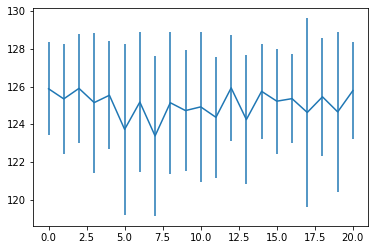

(3, 'position_2')
1 mean/std amp 123.72648086547852 4.300192976914563 error of mean (123.72648086547852, 0.679920209265494)
2 mean/std amp 123.1992784500122 5.6951132060425484 error of mean (123.1992784500122, 0.9004764631799134)
3 mean/std amp 123.16284618377685 5.434838138311025 error of mean (123.16284618377685, 0.8593233615706029)
4 mean/std amp 123.2244483947754 5.203693615868238 error of mean (123.2244483947754, 0.8227762035910472)
5 mean/std amp 123.89358901977539 4.985647540181327 error of mean (123.89358901977539, 0.7883000918894423)
6 mean/std amp 123.53182601928711 4.973046731534015 error of mean (123.53182601928711, 0.7863077291051694)
7 mean/std amp 124.62596702575684 3.9910984528355313 error of mean (124.62596702575684, 0.6310480738467191)
8 mean/std amp 124.51161155700683 5.3394528200747855 error of mean (124.51161155700683, 0.8442416185222774)
9 mean/std amp 123.72470970153809 5.226635879943502 error of mean (123.72470970153809, 0.8264036940489918)
10 mean/std amp 121.9

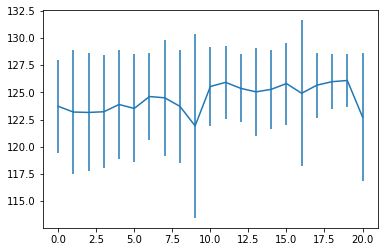

 >>> UNWRAP DATA >>> 


 >>> NUM UNWRAP DATA >>> 
 >>> NUM UNWRAP DATA >>> 


In [27]:
import numpy as np
off_res = avg_axial_fitdata.nu_z - avg_axial_fitdata.nu_res
doff_res = np.sqrt((avg_axial_fitdata.dnu_z.to_numpy()**2 + avg_axial_fitdata.dnu_res.to_numpy()**2).astype(float))
avg_axial_fitdata['off_res'] = off_res
avg_axial_fitdata['doff_res'] = doff_res

print(" >>> AXIAL DATA >>> ")
plot_axial_fitdata = avg_axial_fitdata[avg_axial_fitdata["nu_z"] != 0]
plot_axial_fitdata = plot_axial_fitdata[plot_axial_fitdata["dnu_z"] > 0.0005]
plot_axial_fitdata = plot_axial_fitdata[plot_axial_fitdata["dip_width"] > 0.1]
#plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
fig = px.scatter(plot_axial_fitdata, x="time", y="nu_z", error_y="dnu_z", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

print(" >>> AXIAL UNCERTAINTY >>> ")
#plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
fig = px.scatter(plot_axial_fitdata, x="time", y="dnu_z", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

print(" >>> AXIAL DIP WIDTH >>> ")
#plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
fig = px.scatter(plot_axial_fitdata, x="time", y="dip_width", error_y="ddip_width", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
fig.update_yaxes(matches=None, showticklabels=True)
fig.show()

try:
    print(" >>> Resonator nu_res >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="nu_res", error_y="dnu_res", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()
    
    print(" >>> off_resonance nu_z - nu_res >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="off_res", error_y="doff_res", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    print(" >>> Resonator A >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="A", error_y="dA", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    print(" >>> Resonator Q >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="Q", error_y="dQ", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    print(" >>> Resonator offset >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="off", error_y="doff", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    print(" >>> Resonator threshold amplifier >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="th", error_y="dth", facet_col="trap", facet_row="position", color="average_idx", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()
except:
    pass
    
for gname, grp in plot_axial_fitdata.groupby(['trap', 'position']):
    dipwidth = grp.dip_width.mean()
    tau = 1/(2*np.pi*dipwidth)
    print(gname, 'dipwidth mHz', int(dipwidth*1e3), 'cooling time constant ms', int(tau*1e3))

try:
    print(" >>> AXIAL DATA SINGLE >>> ")
    plot_axial_fitdata_single = avg_axial_fitdata_single[avg_axial_fitdata_single["nu_z"] != 0]
    #plot_axial_fitdata_single = plot_axial_fitdata_single[plot_axial_fitdata_single["dnu_z"] > 0.08]
    plot_axial_fitdata_single['masked'] = False
    #print(plot_axial_fitdata_single)
    #for trap, grp in plot_axial_fitdata_single.groupby('trap'):
    #    plot_axial_fitdata_single.loc[grp.index] = filtering.sigma_size(grp, 'dnu_z')
    #    plot_axial_fitdata_single.loc[grp.index] = filtering.three_sigma(grp, 'nu_z', 'dnu_z', manual_std=3)
    plot_axial_fitdata_single = plot_axial_fitdata_single[ plot_axial_fitdata_single['masked']==False ]
    
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata_single, x="time", y="nu_z", error_y="dnu_z", facet_col="trap", facet_row="position", hover_data=['mcycle', 'cycle'])
    fig.update_yaxes(matches=None)
    fig.show()
    
    print(" >>> INVERTED PHASE DATA >>> ")
    phase_data["acc_time"] = phase_data["acc_time"].astype(str)
    phase_data["phase"] = -phase_data["phase"]
    print(phase_data["acc_time"].unique())
    #fig = px.scatter(phase_data[phase_data["acc_time"]=='40.05'], x="time", y="phase", facet_col="trap", color="position", hover_data=['mcycle', 'cycle', 'position'])
    fig = px.scatter(phase_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    #fig = px.scatter(phase_data, x="time", y="phase", facet_col="position", facet_row="trap", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    #fig.update_yaxes(matches=None)
    fig.show()
    fig = px.scatter(phase_data, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    fig.show()
    phase_data["acc_time"] = phase_data["acc_time"].astype(float)
    phase_data["phase"] = -phase_data["phase"]

    plot_axial_fitdata_single_avg = pd.DataFrame()
    for grpname, grp in plot_axial_fitdata_single.groupby(["mcycle", "trap", "position"]):
        avg = statistics.average_subsets(grp, groupby=["cycle"], errortype="weighted",
                                              columns=["nu_z", "dip_width", "nu_res", "time"], 
                                              dcolumns=["dnu_z", "ddip_width", "dnu_res", None],
                                              masked=True)
        plot_axial_fitdata_single_avg = plot_axial_fitdata_single_avg.append(avg, ignore_index=True)
        
    plot_axial_fitdata_single_avg["type"] = "avg(single)"
    plot_axial_fitdata["type"] = "average"
    plot_axial_fitdata_single["type"] = "single"
    #merged_data = plot_axial_fitdata.append(plot_axial_fitdata_single_avg, ignore_index=True)
    merged_data = plot_axial_fitdata.append(plot_axial_fitdata_single, ignore_index=True)
    #merged_data = merged_data.append(plot_axial_fitdata_single, ignore_index=True)
    #print(merged_data.columns, merged_data.dnu_z)
    for trap, grp in merged_data.groupby("trap"):
        print(trap)
        fig = px.scatter(grp, x="time", y="nu_z", error_y="dnu_z", color="type", facet_row="position", hover_data=['mcycle', 'cycle', 'position'])
        fig.update_yaxes(matches=None, showticklabels=True)
        fig.show()

    print(" >>> Resonator >>> ")
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="nu_res", error_y="dnu_res", facet_col="trap", facet_row="position", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()

    print(" >>> Resonator - nu_z >>> ")
    plot_axial_fitdata["nuzres"] = plot_axial_fitdata["nu_z"] - plot_axial_fitdata["nu_res"]
    plot_axial_fitdata["dnuzres"] = np.sqrt((plot_axial_fitdata["dnu_z"].to_numpy()**2 + plot_axial_fitdata["dnu_res"].to_numpy()**2).astype(float))
    #plot_axial_fitdata = avg_axial_fitdata[(avg_axial_fitdata["nu_z"] != 0) & (avg_axial_fitdata["trap"] == 3)]
    fig = px.scatter(plot_axial_fitdata, x="time", y="nuzres", error_y="dnuzres", facet_col="trap", facet_row="position", hover_data=['mcycle', 'cycle', 'position'])
    fig.update_yaxes(matches=None, showticklabels=True)
    fig.show()
        
except Exception as e:
    #raise
    print( "\n\n SOMETHING WENT WRONG HERE \n", e, "\n\n")



print(" >>> PHASE DATA >>> ")
phase_data["acc_time"] = phase_data["acc_time"].astype(str)
print(phase_data["acc_time"].unique())
#fig = px.scatter(phase_data[phase_data["acc_time"]=='40.05'], x="time", y="phase", facet_col="trap", color="position", hover_data=['mcycle', 'cycle', 'position'])
fig = px.scatter(phase_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
#fig = px.scatter(phase_data, x="time", y="phase", facet_col="position", facet_row="trap", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
#fig.update_yaxes(matches=None)
fig.show()
fig = px.scatter(phase_data, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
phase_data["acc_time"] = phase_data["acc_time"].astype(float)

for gname, grp in phase_data.groupby(['trap', 'position']):
    means = []
    stds = []
    print(gname)
    for ggname, ggrp in grp.groupby('cycle'):
        meanamp = ggrp.amp.mean()
        stdamp = ggrp.amp.std()
        means.append(meanamp)
        stds.append(stdamp)
        print(ggname, 'mean/std amp', meanamp, stdamp, 'error of mean', statistics.mean_and_error(ggrp.amp) )
    print('mean and error of whole measurment:', statistics.mean_and_error(grp.amp))
    plt.errorbar(np.arange(len(means)), means, stds)
    plt.show()
    

print(" >>> PHASE2 DATA >>> ")
phase2_data["acc_time"] = phase2_data["acc_time"].astype(str)
print(phase2_data["acc_time"].unique())
#fig = px.scatter(phase_data[phase_data["acc_time"]=='40.05'], x="time", y="phase", facet_col="trap", color="position", hover_data=['mcycle', 'cycle', 'position'])
fig = px.scatter(phase2_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
#fig = px.scatter(phase_data, x="time", y="phase", facet_col="position", facet_row="trap", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
#fig.update_yaxes(matches=None)
fig.show()
fig = px.scatter(phase2_data, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
phase2_data["acc_time"] = phase2_data["acc_time"].astype(float)

for gname, grp in phase2_data.groupby(['trap', 'position']):
    means = []
    stds = []
    print(gname)
    for ggname, ggrp in grp.groupby('cycle'):
        meanamp = ggrp.amp.mean()
        stdamp = ggrp.amp.std()
        means.append(meanamp)
        stds.append(stdamp)
        print(ggname, 'mean/std amp', meanamp, stdamp, 'error of mean', statistics.mean_and_error(ggrp.amp) )
    print('mean and error of whole measurment:', statistics.mean_and_error(grp.amp))
    plt.errorbar(np.arange(len(means)), means, stds)
    plt.show()
    
  

print(" >>> UNWRAP DATA >>> ")
pre_unwrap_phase["acc_time"] = pre_unwrap_phase["acc_time"].astype(str)
fig = px.scatter(pre_unwrap_phase, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
#fig.update_yaxes(matches=None)
fig.show()
fig = px.scatter(pre_unwrap_phase, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
pre_unwrap_phase["acc_time"] = pre_unwrap_phase["acc_time"].astype(float)


print(" >>> NUM UNWRAP DATA >>> ")
try:
    num_unwrap_phase["acc_time"] = num_unwrap_phase["acc_time"].astype(str)
    fig = px.scatter(num_unwrap_phase, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    #fig.update_yaxes(matches=None)
    fig.show()
    fig = px.scatter(num_unwrap_phase, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    fig.show()
    num_unwrap_phase["acc_time"] = num_unwrap_phase["acc_time"].astype(float)
except:
    pass

print(" >>> NUM UNWRAP DATA >>> ")
try:
    pre_unwrap_phase2["acc_time"] = pre_unwrap_phase2["acc_time"].astype(str)
    fig = px.scatter(pre_unwrap_phase2, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    #fig.update_yaxes(matches=None)
    fig.show()
    fig = px.scatter(pre_unwrap_phase2, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
    fig.show()
    pre_unwrap_phase2["acc_time"] = pre_unwrap_phase2["acc_time"].astype(float)
except:
    pass

In [28]:


print(" >>> PHASE DATA >>> ")
phase_data["acc_time"] = phase_data["acc_time"].astype(str)
phase2_data["acc_time"] = phase2_data["acc_time"].astype(str)

print(phase_data["acc_time"].unique())
print(phase2_data["acc_time"].unique())

fig = px.scatter(phase_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
fig = px.scatter(phase2_data, x="time", y="phase", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
fig = px.scatter(phase_data, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()
fig = px.scatter(phase2_data, x="time", y="amp", facet_col="trap", facet_row="position", color="acc_time", hover_data=['mcycle', 'cycle', 'position'])
fig.show()

phase_data["acc_time"] = phase_data["acc_time"].astype(float)
phase2_data["acc_time"] = phase2_data["acc_time"].astype(float)



 >>> PHASE DATA >>> 
['0.4' '120.05']
['0.4' '120.05']


 >>> PHASE DATA >>> 
2906 2906
[  0.4  120.05]
[  0.4  120.05]
-45.19236186341203 1665276532.231337
[-5.384393034065e-04  8.966060525632e+05]


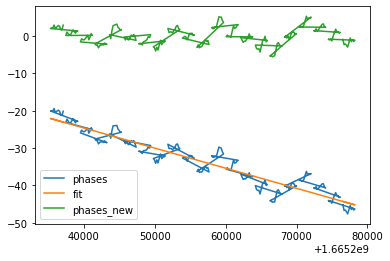

filtered 3sigma amp 3
filtered 3sigma amp2 3


filtered 3sigma phase2 7


mean stds original/corrected 0.7881838061797735 0.7105121086273712
mean correlation/p_value 0.37872603586889303 0.33458152349112014


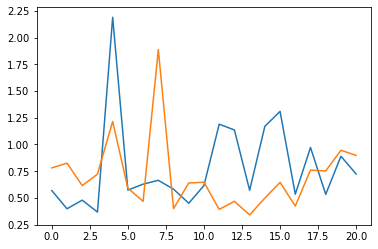

-33.718660020796634 1665325373.283401
[-5.231968590530e-04  8.712603417541e+05]


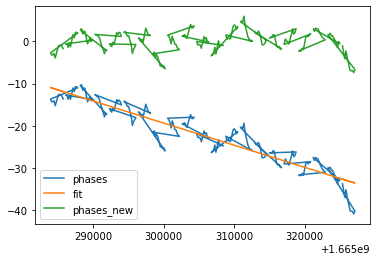

filtered 3sigma amp 4
filtered 3sigma amp2 3


filtered 3sigma phase2 3


mean stds original/corrected 1.388857018854892 1.1135237736349939
mean correlation/p_value 0.8076479076479076 0.0374335751322751


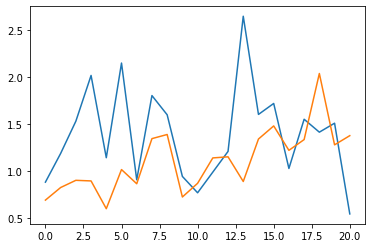

15.298969872782024 1665374616.412965
[-8.263841401027e-04  1.376254069504e+06]


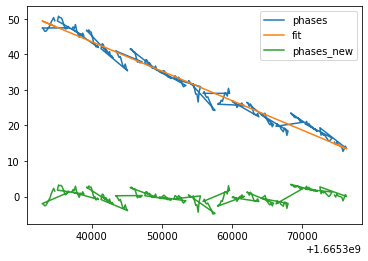

filtered 3sigma amp 3
filtered 3sigma amp2 4


filtered 3sigma phase2 4


mean stds original/corrected 1.3287431309676332 1.4756524995654519
mean correlation/p_value 0.7044320758606473 0.07005107788833327


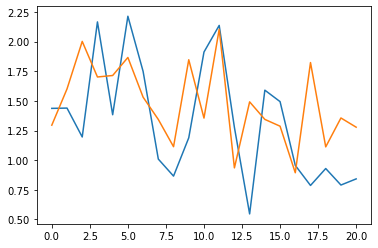

11.984021488820211 1665401110.7307782
[-5.032119135302e-04  8.380630446128e+05]


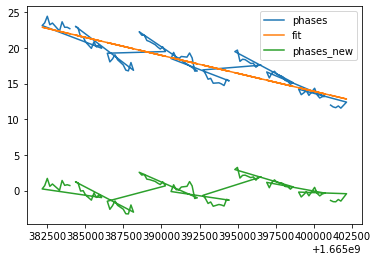

filtered 3sigma amp 2


mean stds original/corrected 0.7405265684625167 0.9008297612675978
mean correlation/p_value 0.36621212121212116 0.2788376246667553


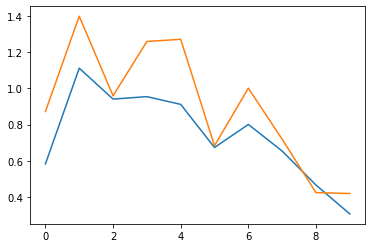

-44.33320239380754 1665276532.6785998
[-8.642213735641e-04  1.439125590967e+06]


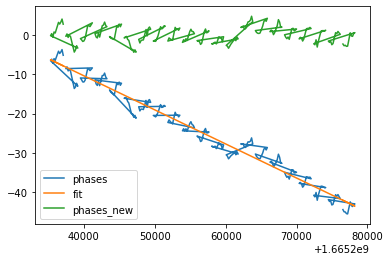

filtered 3sigma amp 2
filtered 3sigma amp2 5


filtered 3sigma phase2 1


mean stds original/corrected 1.137593265161969 1.0282876722169132
mean correlation/p_value 0.4887961245104102 0.19207506760222678


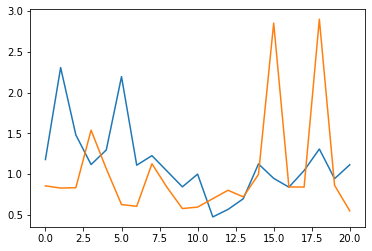

-46.329084904946455 1665325373.718959
[-6.125977911743e-04  1.020127979992e+06]


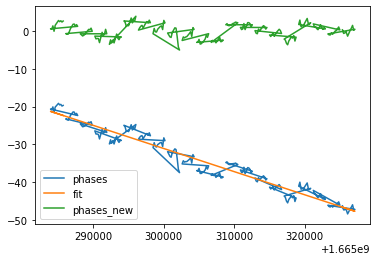

filtered 3sigma amp 5
filtered 3sigma amp2 4


filtered 3sigma phase2 1


mean stds original/corrected 0.6339260973650361 1.0928250366282426
mean correlation/p_value -0.03246753246753247 0.4160403795127383


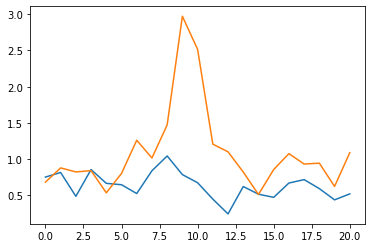

-16.8957721710047 1665374616.83233
[-9.585136156113e-04  1.596263633802e+06]


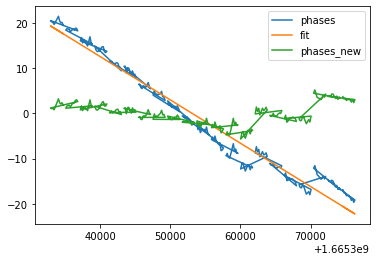

filtered 3sigma amp 3
filtered 3sigma amp2 5


filtered 3sigma phase2 1


mean stds original/corrected 0.6960582039183633 1.3832255960750734
mean correlation/p_value 0.22503607503607498 0.29784895079060714


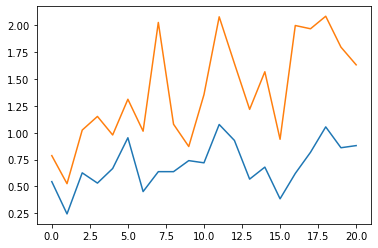

-8.17124284107426 1665401111.208996
[ 3.114102522736e-04 -5.186316113012e+05]


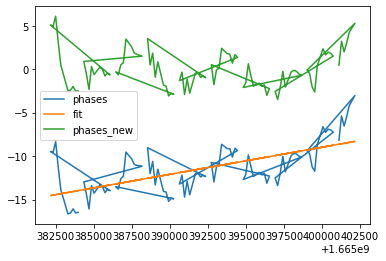

filtered 3sigma amp 2
filtered 3sigma amp2 1


mean stds original/corrected 1.560990185239819 1.4860761239309945
mean correlation/p_value 0.4978787878787879 0.15303957256188022


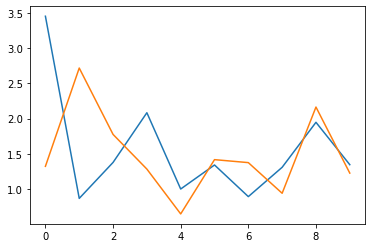

In [29]:
from fticr_toolkit import phase_analysis
import scipy

print(" >>> PHASE DATA >>> ")
print(len(phase_data), len(phase2_data))

accs = phase_data["acc_time"].unique()
print(accs)
print(phase2_data["acc_time"].unique())

phase_data["phase2"] = phase2_data["phase"]
phase_data["amp2"] = phase2_data["amp"]
phase_data["masked"] = False

phase_data_long_acc = phase_data[phase_data["acc_time"] == accs[-1]]
phase2_data_long_acc = phase2_data[phase2_data["acc_time"] == accs[-1]]

phase_data_long_acc["acc_time"] = phase_data_long_acc["acc_time"].astype(str)
phase2_data_long_acc["acc_time"] = phase2_data_long_acc["acc_time"].astype(str)

for trap, tdata in phase_data_long_acc.groupby(["trap", "mcycle"]):
    phase_stds = []
    phase_corr_stds = []
    phases_correlation = []
    phases_correlation_p = []
    
    tdata["phase2"] = np.unwrap(tdata["phase2"])
    tdata["phase"] = np.unwrap(tdata["phase"])

    tdata = phase_analysis.grouped_unwrap(tdata, "phase2", reverse=False, median_group=["cycle"], 
                                            pi_span=1, fit_N=10, fit_order=2, show=False)
    tdata = phase_analysis.grouped_unwrap(tdata, "phase", reverse=True, median_group=["cycle"], 
                                            pi_span=1, fit_N=-10, fit_order=1, show=False)
    
    p_phases = tdata["phase"].to_numpy()
    x = (tdata["time"].astype(np.int64) / 10**9).to_numpy()
    print(p_phases[0], x[0])
    plt.plot(x, p_phases, label="phases")

    coefs = np.polyfit(x, p_phases, 1)
    print(coefs)
    p_phases = p_phases - np.polyval(coefs, x)
    plt.plot(x, np.polyval(coefs, x), label="fit")
    plt.plot(x, p_phases, label="phases_new")
    plt.legend()
    plt.show()
    tdata["phase_undrift"] = p_phases
    
    fig = px.scatter(tdata, x="time", y="phase", title='phase/undrifted')
    fig.add_scatter(x=tdata["time"], y=tdata['phase'], mode="markers", name="phase")
    fig.add_scatter(x=tdata["time"], y=tdata['phase_undrift'], mode="markers", name="phase undrift")
    fig.show()
    
    phase_diff = (tdata['phase_undrift'][1:] - tdata['phase_undrift'][:-1]).to_numpy()
    phase2_diff = (tdata['phase2'][1:] - tdata['phase2'][:-1]).to_numpy()
    
    #tdata['phase_undrift'] = phase_diff#np.insert(phase_diff, 0,0)
    #tdata['phase2'] = phase2_diff#np.insert(phase2_diff, 0,0)
    
    tdata = filtering.three_sigma(tdata, 'amp', around='median', show=False)
    tdata = filtering.three_sigma(tdata, 'amp2', around='median', show=False)
    tdata = filtering.three_sigma(tdata, 'phase2', around='median', show=True)
    
    for gname, gdata in tdata.groupby(["cycle"]):
        #print(gname)

        gdata = gdata[gdata["masked"] == False]
        
        gdata["phase"] = np.unwrap(gdata["phase"])
        gdata["phase_undrift"] = np.unwrap(gdata["phase_undrift"])
        
        #gdata = filtering.three_sigma(gdata, 'phase', around='median', show=False)
        gdata = filtering.three_sigma(gdata, 'phase_undrift', around='median', show=False)
        gdata = filtering.three_sigma(gdata, 'phase2', around='median', show=False)

        gdata = gdata[gdata["masked"] == False]

        gdata["phase_corr"] = gdata["phase_undrift"] - (gdata["phase2"])
        correl = scipy.stats.spearmanr(gdata["phase_corr"].to_numpy(), gdata["phase_undrift"].to_numpy())
        #print(correl)
        phases_correlation.append(correl[0])
        phases_correlation_p.append(correl[1])
        #gdata["phase_corr"] = gdata["phase"] - (gdata["phase2"])
        gdata = filtering.three_sigma(gdata, 'phase_corr', around='median', show=False)

        gdata = gdata[gdata["masked"] == False]

        gdata["phase_corr"] = np.unwrap(gdata["phase_corr"])
        tdata.at[gdata.index, "phase_corr"] = gdata["phase_corr"]
        #print(gdata["phase"].std(), gdata["phase_corr"].std())
        phase_stds.append(gdata["phase"].std())
        phase_corr_stds.append(gdata["phase_corr"].std())
    
    fig = px.scatter(tdata, x="time", y="phase", title='phase/corrected')
    fig.add_scatter(x=tdata["time"], y=tdata['phase_undrift'], mode="markers", name="phase undrifted")
    fig.add_scatter(x=tdata["time"], y=tdata['phase2'], mode="markers", name="phase2")
    fig.add_scatter(x=tdata["time"], y=tdata['phase_corr'], mode="markers", name="phase corrected")
    fig.show()
        
    plt.plot(phase_stds, label="original")
    plt.plot(phase_corr_stds, label="corrected")
    print("mean stds original/corrected", np.mean(phase_stds), np.mean(phase_corr_stds))
    print("mean correlation/p_value", np.mean(phases_correlation), np.mean(phases_correlation_p))
    plt.show()

phase_data_long_acc["acc_time"] = phase_data_long_acc["acc_time"].astype(float)
phase2_data_long_acc["acc_time"] = phase2_data_long_acc["acc_time"].astype(float)

In [30]:
for gname, grp, in plot_axial_fitdata.groupby(["mcycle", "trap", "position"]):
    print("mc, trap, pos", gname)
    
    try:

        t = grp.time.astype('int64').to_numpy()//1e9
        t = t - t.min()
        z = grp.nu_z.to_numpy()
        z = z/z.mean()*2
        plt.plot(t, z)
        plt.show()
        visualization.allanvariance(z, t, plot=True)
    
    except:
        print('pass')

mc, trap, pos (1, 2, 'position_1')
pass
mc, trap, pos (1, 2, 'position_2')
pass
mc, trap, pos (1, 3, 'position_1')
pass
mc, trap, pos (1, 3, 'position_2')
pass
mc, trap, pos (2, 2, 'position_1')
pass
mc, trap, pos (2, 2, 'position_2')
pass
mc, trap, pos (2, 3, 'position_1')
pass
mc, trap, pos (2, 3, 'position_2')
pass
mc, trap, pos (3, 2, 'position_1')
pass
mc, trap, pos (3, 2, 'position_2')
pass
mc, trap, pos (3, 3, 'position_1')
pass
mc, trap, pos (3, 3, 'position_2')
pass
mc, trap, pos (4, 2, 'position_1')
pass
mc, trap, pos (4, 2, 'position_2')
pass
mc, trap, pos (4, 3, 'position_1')
pass


In [31]:
## NOW FITTING THE DATA - checking for fit systematics:


if False:
    for mc in mcycles:
        for subcycle in pnp_subcycles[mc]:
            #if int(subcycle[5:]) > 8 or int(mc[5:]) > 1:
            #    continue
            for pos in positions:
                for trap in traps:

                    
                    
                    if trap == "trap2":
                        continue
                    
                    
                    
                    
                    #print(trap)
                    avg_indexes = list(set(grouping))
                    #for idx, avg_len in enumerate(grouping):
                    for idx in avg_indexes:
                        path = "/m"+str(mc)+"/s"+str(subcycle)+"/"+str(pos)+"/"+str(trap)+"/avggrp"+str(idx)
                        print(path)
                        if idx==-1:
                            continue

                        try:
                            try:
                                with h5py.File(axial_avg_all_filename, 'r') as fobj:
                                    #fobj.visit(print)
                                    dset = fobj[path]
                                    data = dset[:]
                                    spec = data_conversion.Spectrum(dset)
                                    attrs = data_conversion.attrs_to_dict(dset)
                                    #for key, val in dset.attrs.items():
                                    #    #print(key, val)
                            except:
                                raise
                                print(path, "not available, continue with other data")
                                dset = pd.Series(data=[ int(mc[5:]), int(subcycle[5:]), pos, int(trap[4:]), 0, '19700101_000000.000',
                                                       0, 0, 0, 0, 0, False, idx, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0 ] , index=avg_axial_fitdata.columns)
                                continue
                            
                            nu_z = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["nu_z"]
                            LO = meas_config[pos]["configuration"]["traps"][int(trap[4:])]["LO"]

                            if len(spec.freqs) < 10000:
                                # typically at least a resolution of 0.1 Hz (seconds), so at least 1000 kHz span, otherwise, its bad data.
                                raise IndexError("The given spectrum is too small (<10000 points) to be an axial spectrum... ")
    
                            x = spec.freqs
                            y = spec.amps
    
                            # trap 2
                            config = {
                                "center" : nu_z,
                                "nu_z" : nu_z,
                                "dip_center": nu_z,
                                "res_span" : 3000,
                                "resonator_span" : 3000, # same same
                                "span" : 10,
                                "dip_span": 20,
                                "q_guess" : 4000, 
                                "dip_range" : 5, 
                                "width_range" : [0.1, 3],
                                "min_dip_width": 0.01,
                                "plot": False,
                                "print_fit_report": False,
                                "plot_results": plot,
                                "fancy_plot": True,
                                "equal_widths": False,
                                "vary_off": False,
                                "vary_slope": False,
                                "vary_A": True,
                                "vary_nu_res": False,
                                "vary_Q": True,
                                "vary_nu_z_jitter": False,
                                "nu_z_jitter": 0.0,
                                "slope": 0.0,
                                "min_dip_depth": 4.0,
                                "double_dips": False,
                            }
            
                            if trap == 'trap3':
                                config['dip_span'] = 80
                                config['q_quess'] = 11000
                                config['vary_A'] = True
                                config['vary_nu_res'] = True
                                config['vary_Q'] = True
                        
                            
                            try:
                                
                                if fit_func == 'menno':
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, beta0 = [None, 5e3, None, 1e-6, None, None, 0.1], 
                                    #                                        res_span=config['res_span'], dip_span=config['dip_span'], fixed_res='varA',
                                    #                                        rough_resonator=0, auto_better_guess=True)
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    popt, perr, data = fitaxial.mennofit(x, y, nu_z, dip_span=config['dip_span'], dip_odr=False, tight_fit_bounds=[0,1,0,1,1,0,0])
                                    #popt, perr, data = fitaxial.mennofit(x, y, nu_z, res_span=2200, dip_span=dip_span, fixed_res=False)   
                                    #data, popt, pcov = fit_dip_alex(x, y, **fit_config)
                                    #data["fit_success"] = True
                                    data["fit_err_chi**2_red"] = data['fit_err']
                                    #plt.plot(x,y,label = 'data')
                                    #plt.plot(x, dip_func_alex(x,*popt)+ data['amp_offset'], label = "dip_fit")
                                    #plt.xlim(data["nu_z"] - 20, data["nu_z"] + 20)
                                    #plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z config')
                                    #plt.legend()
                                    #plt.show()

                                elif fit_func == 'pavel':
                                    
                                    fitPavel = fitaxialClass_Pavel.AXIAl_FIT(config)
                                    data = fitPavel.fit_axial_dip(x, y, settings["downsample"])
                                    data['fit_err_chi**2_red'] = data['redchi']
                                    data['th'] = data['slope']
                                    data['dth'] = data['dslope']
                                    data['off'] = data['offset']
                                    data['doff'] = data['doffset']
                                    print(data)
                                    
                                    nu_z_list = []
                                    dnu_z_list = []
                                    nu_res_list = np.arange(-5, 5, 1) + data["nu_res"]
                                    for nu_res_fix in nu_res_list:
    
                                        fixed_parameters = {
                                            "nu_res": nu_res_fix
                                        }
                                        config["vary_nu_res"] = False
            
                                        fitPavel = fitaxialClass_Pavel.AXIAl_FIT(config)
                                        data = fitPavel.fit_axial_dip(x, y, settings["downsample"], fixed_parameters)
                                        nu_z_list.append(data["nu_z"])
                                        dnu_z_list.append(data["dnu_z"])
                                    popt = np.polyfit(nu_res_list, nu_z_list, 1)
                                    print(popt)
                                    plt.errorbar(nu_res_list, nu_z_list, yerr=dnu_z_list)
                                    plt.show()
                                    puff
                            
                            
                                elif fit_func == 'daniel':
                                    
                                    fit_obj = fitaxial.AXIAl_FIT()
                                    fit_obj = fitaxialClass_old.AXIAl_FIT(fit_opt)
                                    popt, perr, data = fit_obj.fit_axial_dip_test_new(x, y)
                                    #popt, perr, data = fit_obj.fit_axial_dip(x, y)

                            except:
                                raise
                                data = {"fit_success": False}

                            
                            if not data["fit_success"]:
                                raise ValueError('bad fit')


                        except Exception as e:
                            raise
                            spec.cut(nu_z, 60)
                            x, y = spec.freqs, spec.amps
                            plt.vlines([nu_z], np.min(y), np.max(y), label='nu_z guess')
                            plt.plot(x, y)
                            plt.show()
                            #raise
                            print("\n FIT FAILED \n DATA MISSING? \nTRY raise to see what really happenig...", e, "\n")
                            
display(avg_axial_fitdata)

,mcycle,cycle,position,trap,acc_time,time,nu_z,dnu_z,dip_width,ddip_width,...,Q,dQ,th,dth,off,doff,A,dA,off_res,doff_res
0,1,1,position_1,2,120.05,2022-10-08 13:45:46.967994,698306.264784963569,0.007473897885,3.814040279507,0.063541070479,...,3282.301481795752,9.572956436877,0.0,0.000005333728,9.153734419824e+12,7.141782868287e+10,2.891627224970e+15,1.362759383011e+13,1.608731798828,0.262563417349
1,1,1,position_1,3,120.05,2022-10-08 13:45:47.385705,477202.105670023186,0.011935515319,22.675330027179,0.236172444482,...,9390.971574110805,122.526044807868,0.0,0.000004976214,2.002012400972e+12,6.216886158761e+09,2.955661111096e+15,3.122500935302e+13,0.091347514768,0.193670384229
2,1,1,position_2,2,120.05,2022-10-08 13:27:01.962046,706772.025573720108,0.007977812936,4.051109853162,0.066333168355,...,3197.995900341981,9.418163742047,0.0,0.000005451078,1.059338558696e+13,8.361805935939e+10,3.053662317985e+15,1.440046526028e+13,5.186628710246,0.274936908170
3,1,1,position_2,3,120.05,2022-10-08 13:27:02.375592,471486.120961939392,0.011426886537,24.349325986474,0.252494448390,...,10853.987192674813,129.479601343060,0.0,0.000004937254,1.785516140984e+12,5.529870152690e+09,3.591050058255e+15,4.003709228804e+13,-0.788712804613,0.163536564484
4,1,2,position_1,2,120.05,2022-10-08 14:20:05.007225,698306.253255662392,0.007311426031,3.870380546964,0.062565695971,...,3288.235996674766,9.519204049994,0.0,0.000005293276,8.992305276747e+12,7.076455909770e+10,2.914663690869e+15,1.364867806722e+13,1.549841206055,0.260315049967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,4,9,position_2,3,0.00,1970-01-01 00:00:00.000000,0.000000000000,0.000000000000,0.000000000000,0.000000000000,...,0.000000000000,0.000000000000,0.0,0.000000000000,0.000000000000e+00,0.000000000000e+00,0.000000000000e+00,0.000000000000e+00,0.000000000000,0.000000000000
288,4,10,position_1,2,120.05,2022-10-10 11:42:39.250327,698306.319426162867,0.016265823820,3.784285526055,0.138802862886,...,3283.930040388847,21.264047644092,0.0,0.000011842787,9.000830956250e+12,1.575611052021e+11,2.887050349334e+15,3.022349520061e+13,1.254270796897,0.582983325603
289,4,10,position_1,3,0.00,1970-01-01 00:00:00.000000,0.000000000000,0.000000000000,0.000000000000,0.000000000000,...,0.000000000000,0.000000000000,0.0,0.000000000000,0.000000000000e+00,0.000000000000e+00,0.000000000000e+00,0.000000000000e+00,0.000000000000,0.000000000000
290,4,10,position_2,2,120.05,2022-10-10 11:30:48.618081,706772.099664533278,0.007834124268,4.027897280391,0.066210654728,...,3190.116517515895,9.271168440308,0.0,0.000005418132,9.875160958268e+12,8.177309321885e+10,3.040885182401e+15,1.416383253966e+13,5.391207220615,0.272372159387
